In [1]:
import os.path
import numpy as np
import matplotlib.pyplot as plt
import scipy
import refnx #https://refnx.readthedocs.io/en/latest/installation.html
from refnx.dataset import ReflectDataset, Data1D
from refnx.analysis import Transform, CurveFitter, Objective, Model, Parameter
from refnx.reflect import SLD, Slab, ReflectModel
import time
import mpld3 #you may need to pip install mpld3 to get this working - it allows zoom action on inline plots
import seaborn as sns
#pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/XRay/XRR/'
path = os.getcwd()

pth = '../Data/'
%load_ext autoreload
%autoreload 2
import matplotlib as mpl
%matplotlib widget
import glob 
import ana_xrr
colors = ['#4053d3', '#b51d14', '#ddb310','#348f42','#7e1e9c', '#75bbfd', '#cacaca']
sns.set_palette(colors)

In [12]:
level = 'alox/al/alox/buff/al2o3'
layer_list = level.split('/')

print(layer_list)
thick = [10,500,10,5, np.inf]
rough = [3,3,3,3,5]
layer_list_names = [f"{layer}_{i}" for i, layer in enumerate(layer_list)]
print(layer_list)
layers =[]
# Make layers
layers.append(ana_xrr.make_layer('air', thick=np.inf, rough=0, sld=0)) 
for i, (layer, name, t, r) in enumerate(zip(layer_list, layer_list_names, thick, rough)):
    layers.append(ana_xrr.make_layer(name, thick=t, rough=r, material=layer))

from refnx.reflect import Structure

structure = Structure(layers)


['alox', 'al', 'alox', 'buff', 'al2o3']
['alox', 'al', 'alox', 'buff', 'al2o3']


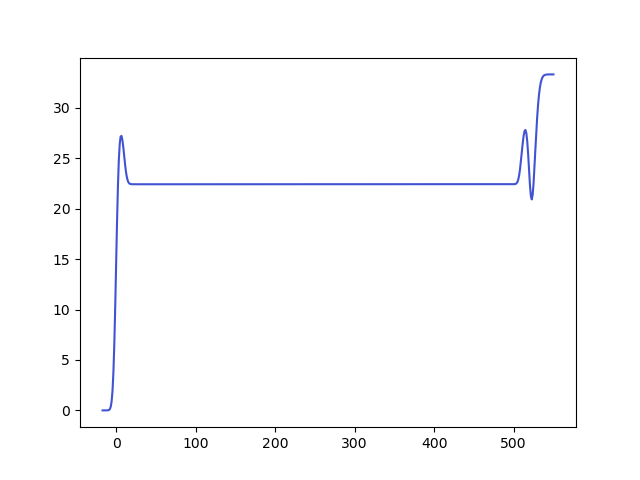

In [14]:
plt.figure()

plt.plot(*structure.sld_profile())

['alox', 'al', 'buff', 'alox', 'al', 'buff', 'al2o3']
['alox', 'al', 'buff', 'alox', 'al', 'buff', 'al2o3']


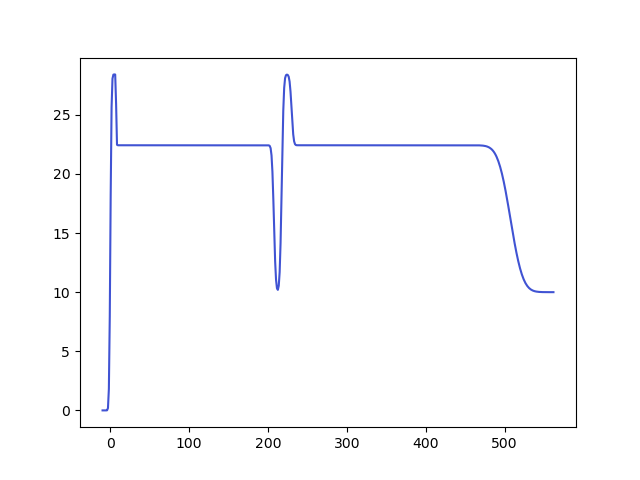

In [24]:
level = 'alox/al/buff/alox/al/buff/al2o3'
layer_list = level.split('/')

print(layer_list)
thick = [7.4,200,10,12.5, 277.5, np.inf]
sld = [34,20,18,22.5,20,33.385]
rough = [1.22,0.43,2,2,2,12.4]

layer_list_names = [f"{layer}_{i}" for i, layer in enumerate(layer_list)]
print(layer_list)
layers =[]
# Make layers
layers.append(ana_xrr.make_layer('air', thick=np.inf, rough=0, sld=0)) 
for i, (layer, name, t, r) in enumerate(zip(layer_list, layer_list_names, thick, rough)):
    layers.append(ana_xrr.make_layer(name, thick=t, rough=r, material=layer))

from refnx.reflect import Structure

plt.figure()

plt.plot(*structure.sld_profile())

structure = Structure(layers)

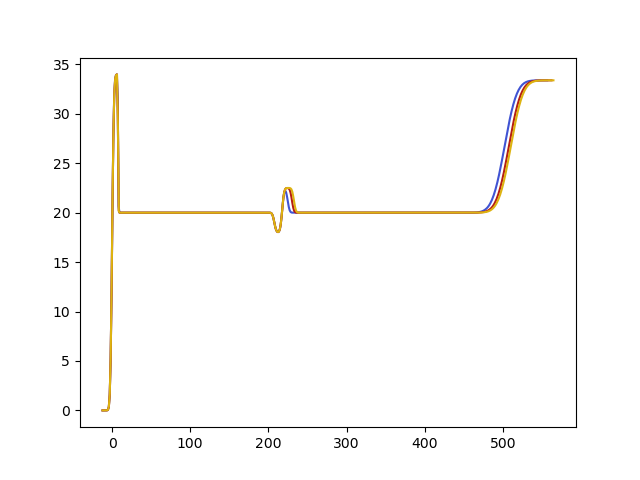

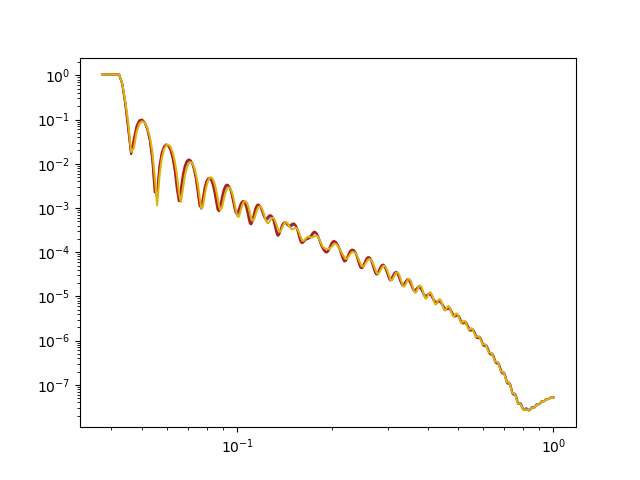

In [52]:
level = 'alox/al/buff/alox/al/buff/al2o3'

thick = [7.6,200,10,12.5, 277.5, np.inf]
sld = [34,20,18,22.5,20,33.385]
rough = [1.8,0.43,2,2,2,12.4]

structure = ana_xrr.make_layer_stack(level, thick, rough, sld)

thick[3]=15
structure2 = ana_xrr.make_layer_stack(level, thick, rough, sld)


thick[3]=7
structure3 = ana_xrr.make_layer_stack(level, thick, rough, sld)

plt.figure()
plt.plot(*structure3.sld_profile())
plt.plot(*structure.sld_profile())
plt.plot(*structure2.sld_profile())

cfg_mod = {'scale':1.05, 'bkg':2.5e-8, 'q_offset':-2e-3, 'dq':2}
model = ana_xrr.make_model(structure, cfg_mod)
model2 = ana_xrr.make_model(structure2, cfg_mod)
model3 = ana_xrr.make_model(structure3, cfg_mod)
qrng = [0.0375, 1]
q = np.linspace(qrng[0],qrng[1], 1001)
plt.figure()
plt.loglog(q, model(q))
plt.loglog(q, model2(q))
plt.loglog(q, model3(q))

data = ana_xrr.loadRefData(pth + flist[1],qrng=qrng)

#plt.plot(data.x, data.y)

objective = Objective(model, data)


2.1989581327740546: : 748it [04:17,  2.91it/s]

(Objective(ReflectModel(Structure(components=[Slab(Parameter(value=inf, name='air - thick', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), SLD([Parameter(value=0.0, name='air - sld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), Parameter(value=0.0, name='air - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None)], name='air'), Parameter(value=0.0, name='air - rough', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None), name='air', vfsolv=Parameter(value=0.0, name='air - volfrac solvent', vary=False, bounds=Interval(lb=0.0, ub=1.0), constraint=None), interface=None), Slab(Parameter(value=6.274656606800972, name='alox_0 - thick', vary=True, bounds=Interval(lb=0.0, ub=40.0), constraint=None), SLD([Parameter(value=34.905186054034075, name='alox_0 - sld', vary=True, bounds=Interval(lb=33.531606191375104, ub=89.4176165103336), constraint=None), Parameter(value=-0.37, name='alox_0 - isld', vary=False, boun

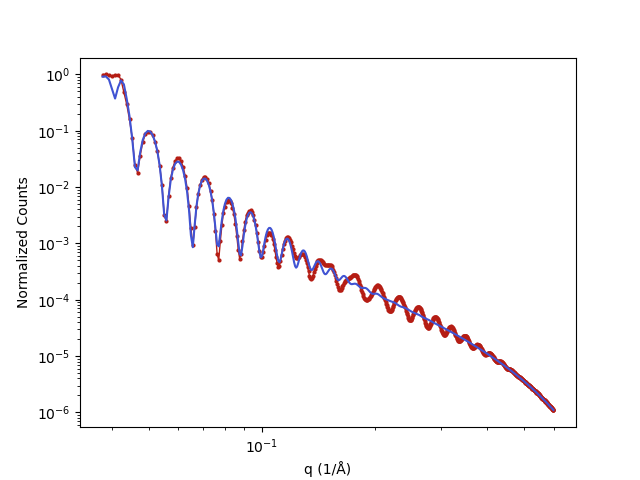

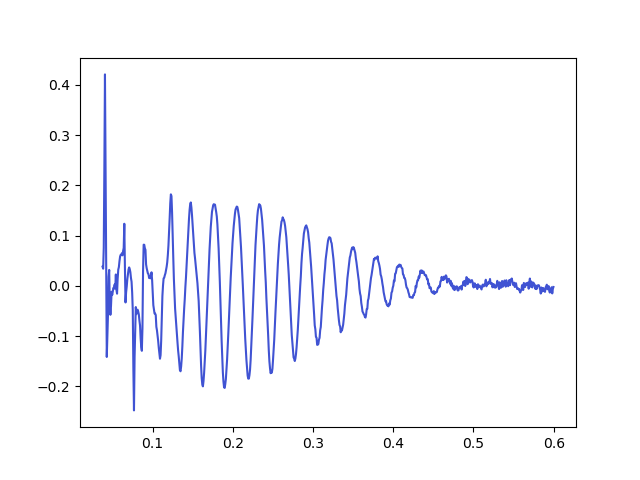

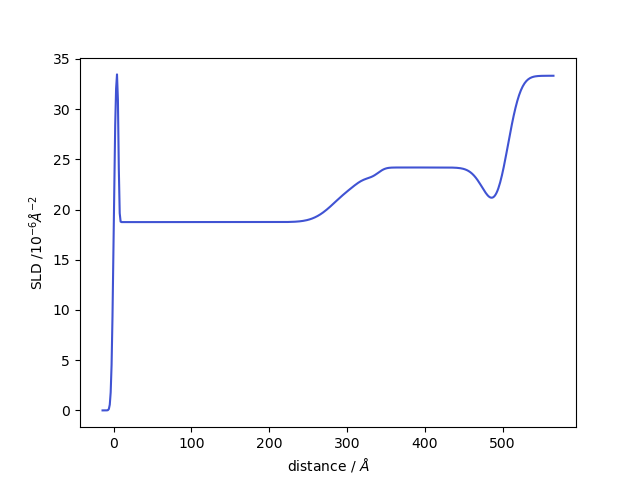

In [236]:
ana_xrr.sim(pth + flist[1], 'alox/al/buff/alox/al/buff/al2o3', par4, [0.037, 0.6])

In [ ]:
obj

In [169]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 'thk':[31, 45, 5.6, 576, 1, np.inf], 'rough':[3.7,1.6,5,7.3,1,3], 'sld':[20, 28, 11, 85, 18, 33.319]}
obj, par3 = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/al2o3', par, [0.26, 1], SLD_rng=[0.8,0.3], fit=False)
ana_xrr.generate_table(par) 

KeyError: 'sub_rough_max'

0.2870696794231745: : 1000it [04:25,  3.77it/s]


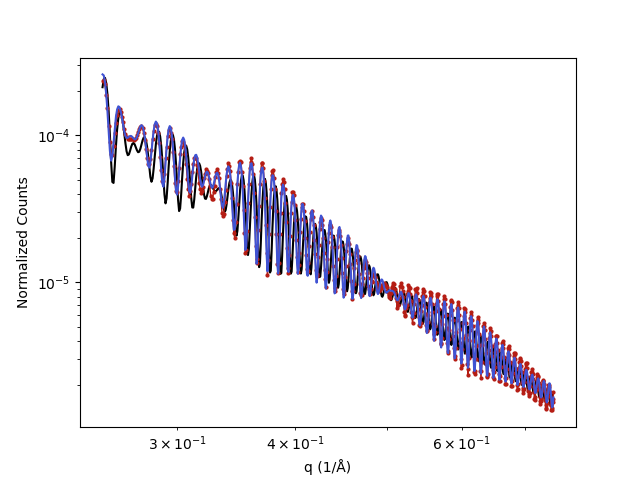

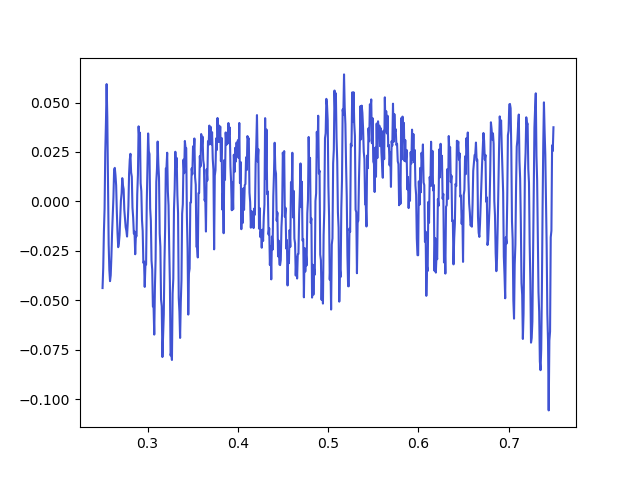

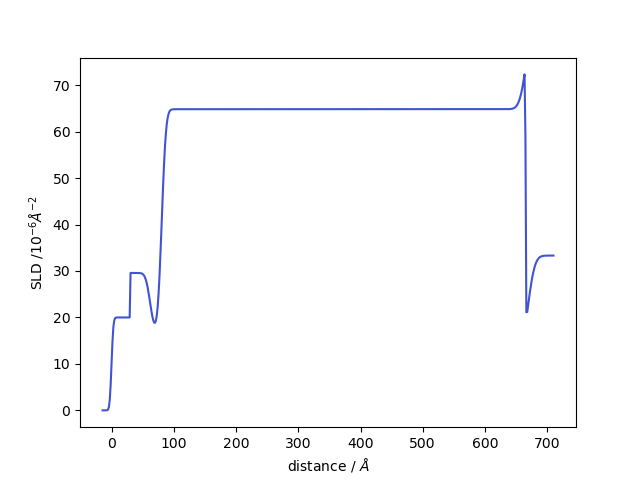

In [180]:
par2={'scale':2, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[31, 45, 5.6, 576, 1, np.inf], 
     'rough':[3.7,1.6,5,7.3,1,3], 
     'sld':[20, 28, 11, 65, 11, 33.319]}

obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/al2o3', par2, [0.25, 0.75], SLD_rng=[0.9,0.3], fit=True)


2.384935261802708: : 387it [02:08,  3.00it/s] 


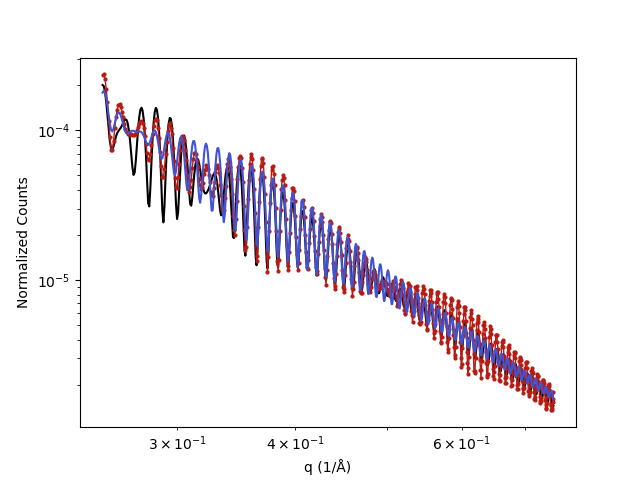

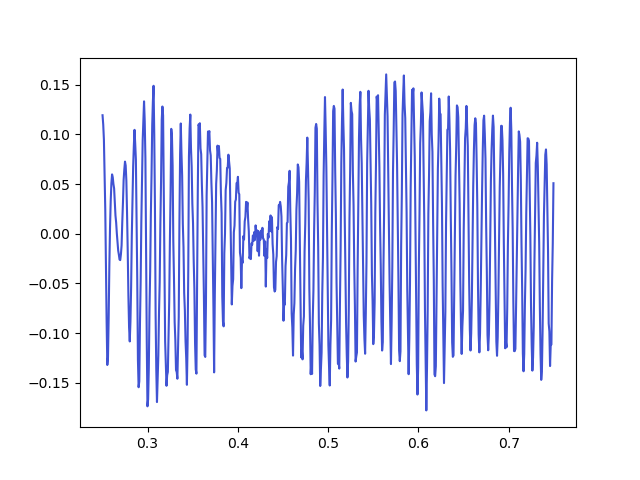

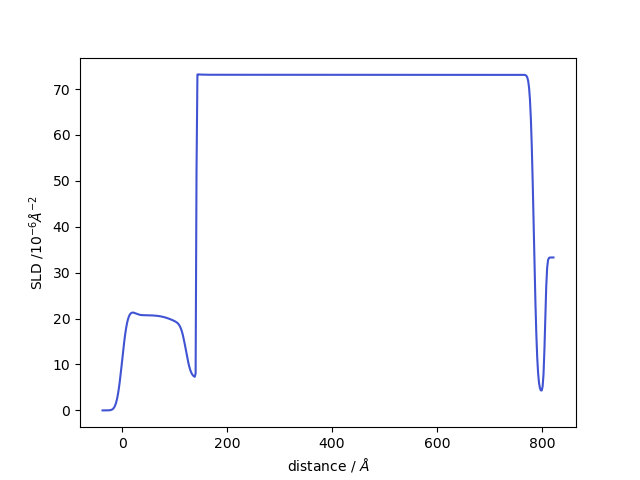

In [183]:
par2={'scale':2, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[31, 45, 5.6,5, 576, 1, np.inf], 
     'rough':[3.7,1.6,5,5,7.3,1,3], 
     'sld':[20, 28, 11, 11,65, 11, 33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/buff/nb/buff/al2o3', par2, [0.25, 0.75], SLD_rng=[0.9,0.3], fit=True)
ana_xrr.generate_table(par)

In [ ]:
ana_xrr.generate_table(par)

In [123]:
par

{'thk': array([ 14.81284723, 115.57152934,  37.71531476, 668.34559   ,
         24.77095455,          inf]),
 'rough': array([ 7.91805614,  5.39518917,  5.70124203,  0.78405378,  0.3815917 ,
        11.6503558 ]),
 'sld': array([22.40745583, 21.30137174,  5.76983565, 54.59979564,  6.20256619,
        33.319     ]),
 'layers': array(['alox_0', 'al_1', 'buff_2', 'nb_3', 'buff_4', 'al2o3_5'],
       dtype='<U7'),
 'chisq': array(6.60659531),
 'scale': 0.9416387198354551,
 'bkg': 3.359946688006967e-08,
 'dq - resolution': 2.0,
 'q_offset': 0.015262336930294707}

0.07527993148984195: : 1000it [05:36,  2.97it/s]


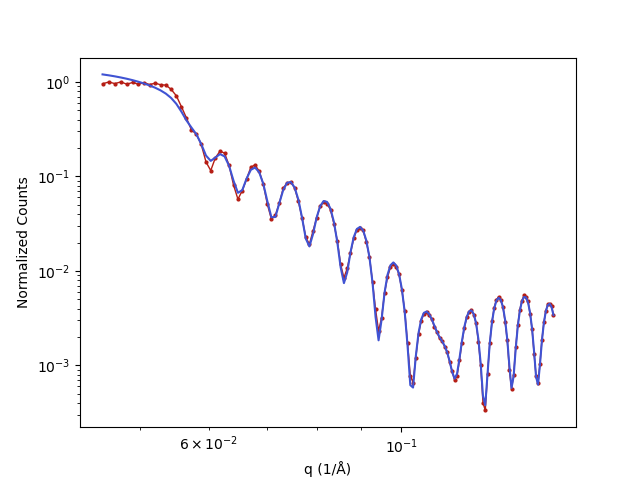

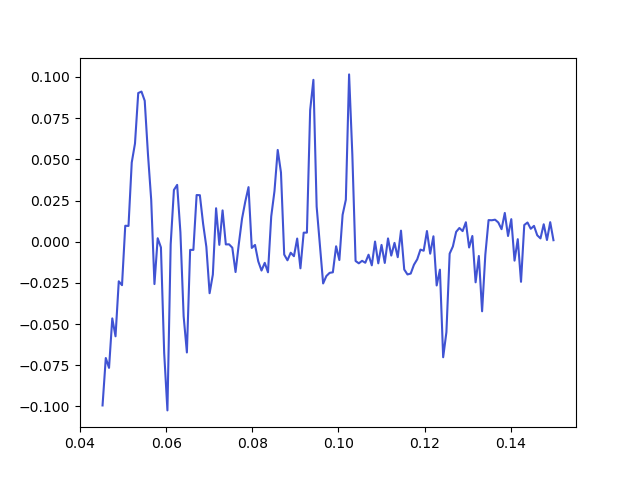

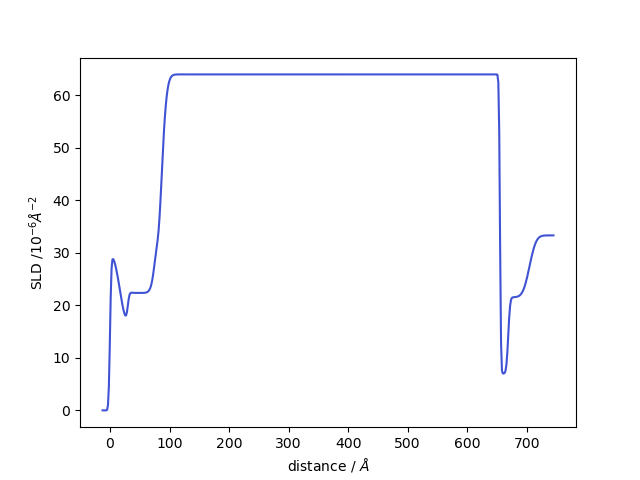

In [237]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11,10, 45, 5.6,5, 576, 1,5, np.inf], 
     'rough':[3.7,2,1.6,5,5,7.3,1,1,3], 
     'sld':[28, 28,20, 11, 11,65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.08296912497649979: : 1000it [03:53,  4.29it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       10.537592        0.974386          30.164540
   al_1       66.579193        0.767190          22.246699
 buff_2        5.986457        0.049618           4.547989
   nb_3      571.495964        7.866434          64.572737
 buff_4       14.292040        0.667140           7.127393
 alox_5       38.311807        7.518633          20.581301
al2o3_6             inf       11.340046          33.319000

Additional Parameters:
       Parameter               Value
           Chisq 0.16525539550481624
Log10 Background            -6.30103
 DQ - Resolution            1.563117
        Q Offset            0.001209
           Scale            1.453363


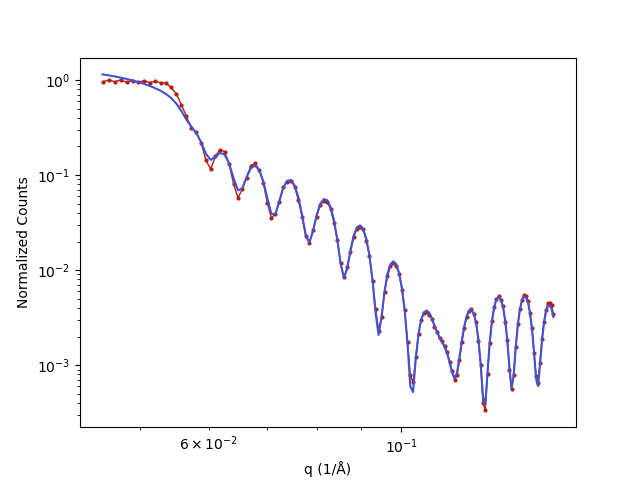

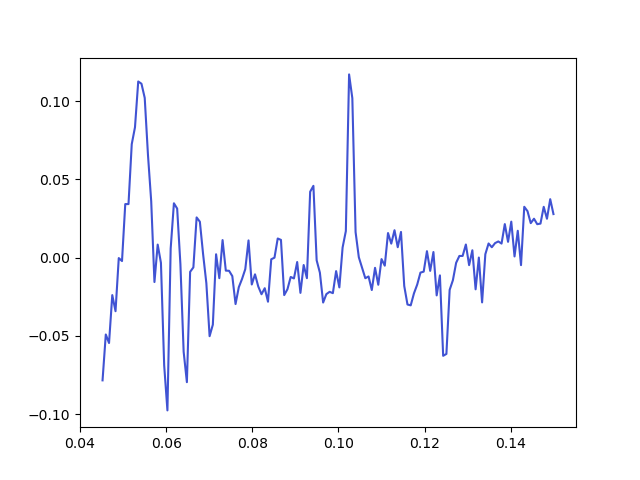

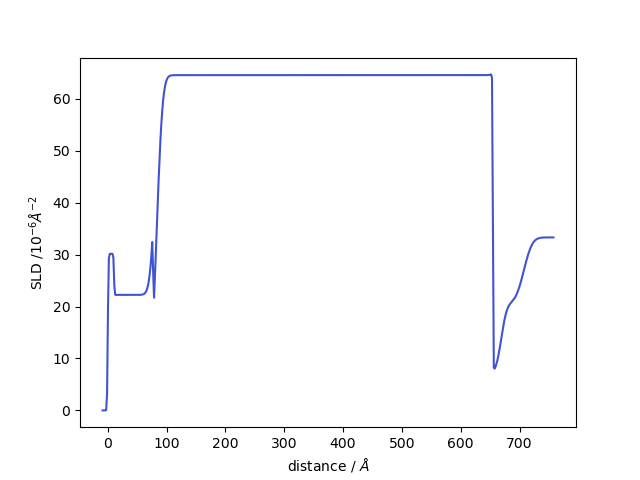

In [246]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6, 576, 1,5, np.inf], 
     'rough':[3.7,1.6,5,7.3,1,1,3], 
     'sld':[28, 20, 11, 65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.17889735622549072: : 1000it [04:43,  3.52it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0        9.900840        4.060246          39.156019
   al_1       59.072824        4.481282          21.498738
 buff_2       14.203564        1.370274          17.631454
   nb_3      568.965467        7.852216          64.197507
 buff_4       18.480010        1.875416           6.152250
 alox_5       35.296682        9.850224          16.553753
al2o3_6             inf       16.581864          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.3563881957468681
Log10 Background               -9.0
 DQ - Resolution           1.368768
        Q Offset           0.001067
           Scale           1.312354


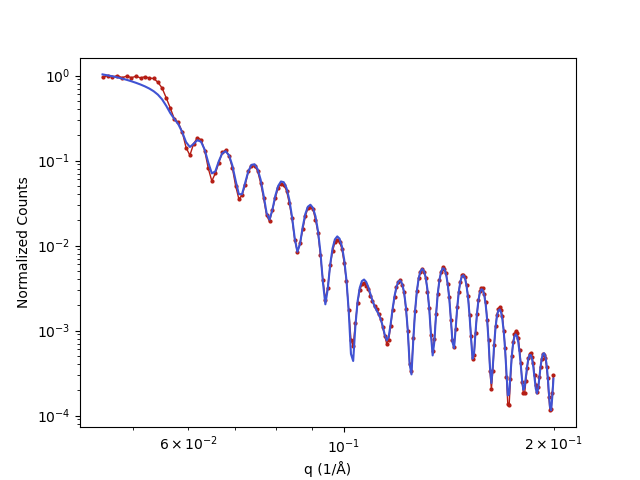

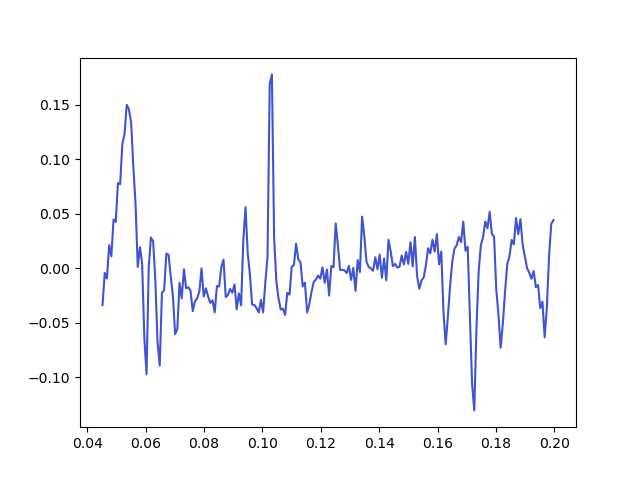

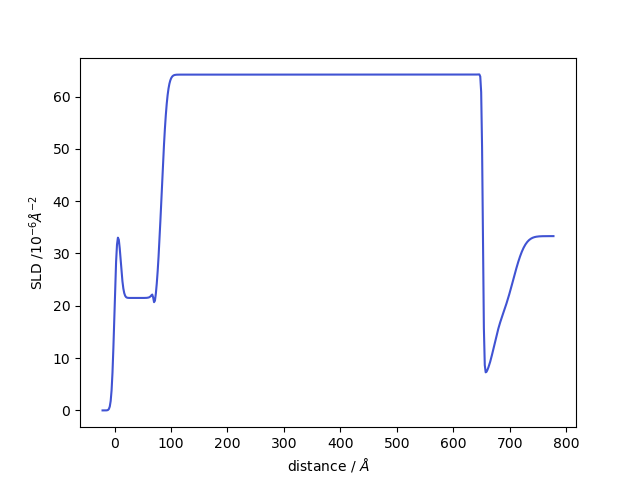

In [250]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6, 576, 1,5, np.inf], 
     'rough':[3.7,1.6,5,7.3,1,1,3], 
     'sld':[28, 20, 11, 65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par2, [0.045, 0.2], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.2756882503346564: : 1371it [06:31,  3.50it/s] 


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       17.432960        3.841093          28.899346
   al_1       52.303015        1.550611          18.413266
 buff_2       15.755693        1.041122          13.927135
   nb_3      573.569518        7.958532          59.614578
 buff_4       12.762231        1.622145           3.785090
 alox_5       27.638542        7.682148          11.292643
al2o3_6             inf       19.207118          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.5509775642591485
Log10 Background               -9.0
 DQ - Resolution           1.154767
        Q Offset          -0.000657
           Scale           1.367374


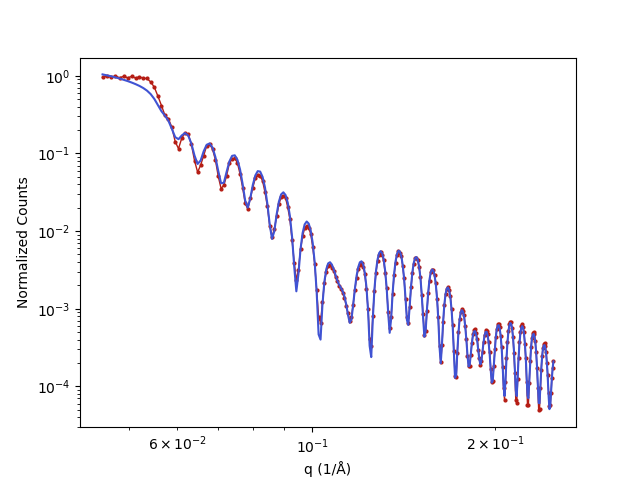

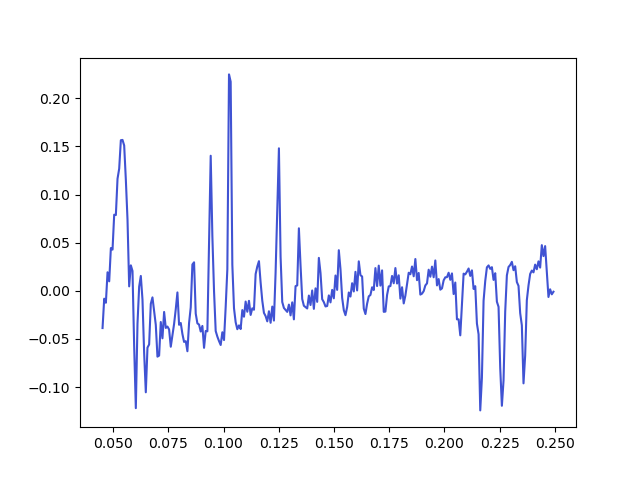

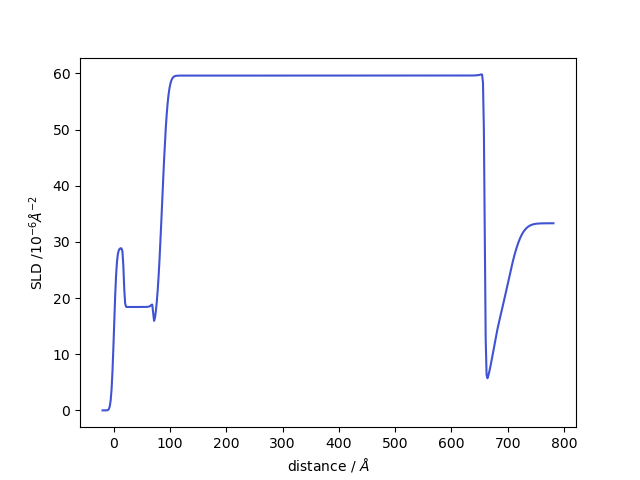

In [251]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6, 576, 1,5, np.inf], 
     'rough':[10,1.6,5,7.3,1,1,10], 
     'sld':[28, 20, 11, 65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par, [0.045, 0.25], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

2.768878251095677: : 381it [02:17,  2.78it/s] 


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0        8.438097        8.357833           8.972654
   al_1       83.454416        6.207604          14.926795
 buff_2        4.370561        8.383126           5.912574
   nb_3      589.393902        0.437082          44.041402
 buff_4       34.735786        6.108626          10.128903
 alox_5       34.340933        0.075228          16.345453
al2o3_6             inf        0.855444          33.319000

Additional Parameters:
       Parameter             Value
           Chisq 5.535747994164466
Log10 Background              -9.0
 DQ - Resolution          0.983825
        Q Offset         -0.007241
           Scale          1.994872


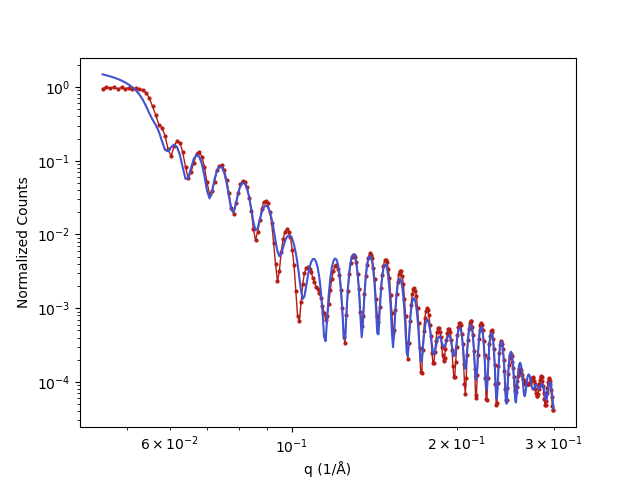

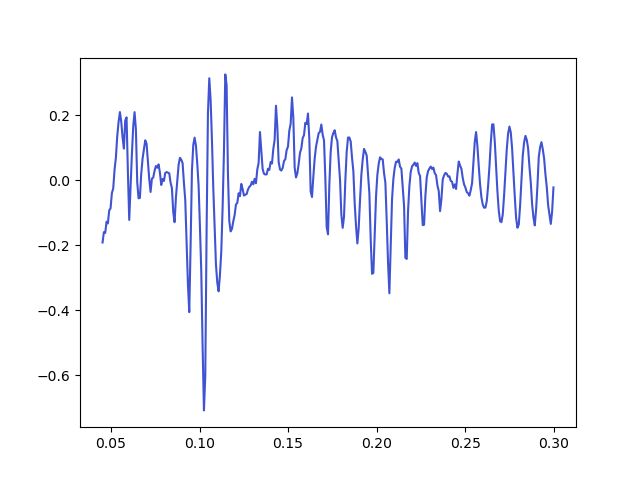

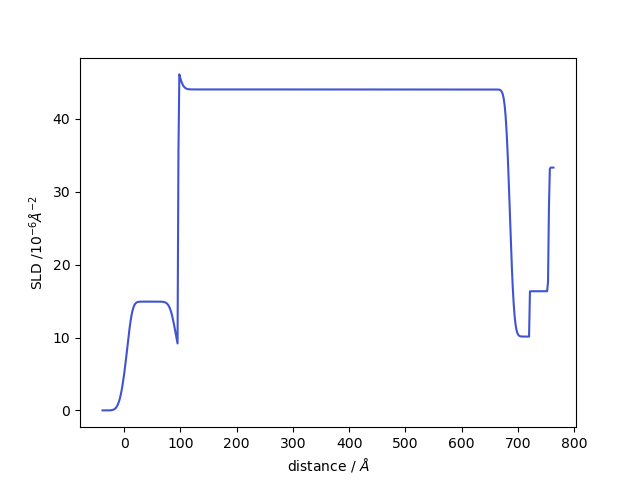

In [254]:
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par, [0.045, 0.3], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

2.312156279471787: : 469it [02:14,  3.48it/s] 


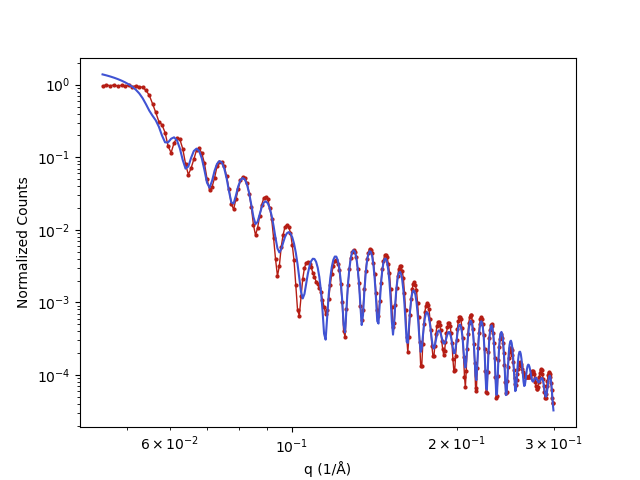

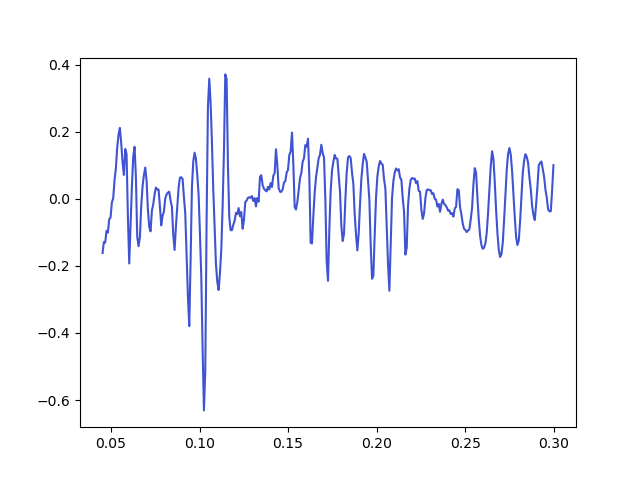

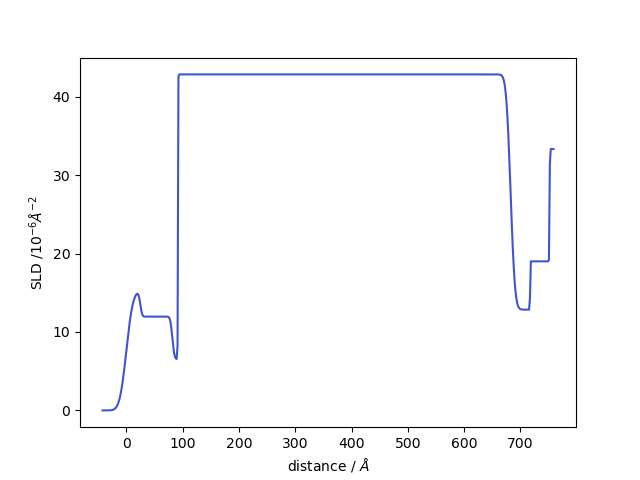

In [257]:
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par, [0.045, 0.3], SLD_rng=[0.7,0.2], fit=True)

0.13256897453844324: : 1000it [04:15,  3.91it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       26.441713        3.575521          34.587466
   al_1       57.481451        4.173051          22.243522
 buff_2        1.948163       14.382564          10.055022
   nb_3      564.574457        6.028473          68.682478
 buff_4        4.906849        0.144330           6.073978
 alox_5       37.485266        7.799427          50.708671
al2o3_6             inf       19.720205          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.2623749125353911
Log10 Background               -9.0
 DQ - Resolution           1.544612
        Q Offset           0.003139
           Scale           0.847131


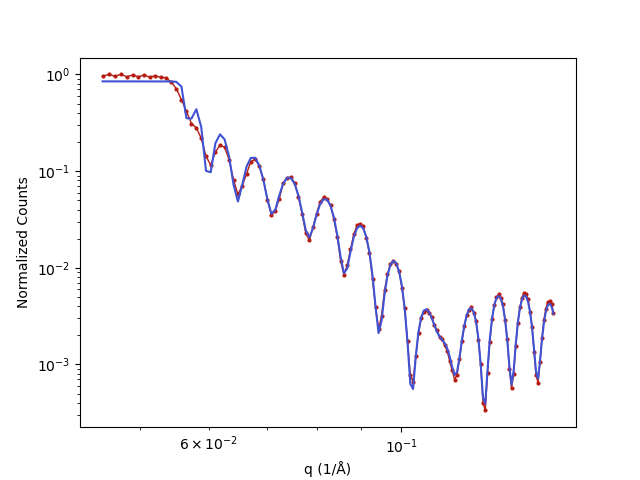

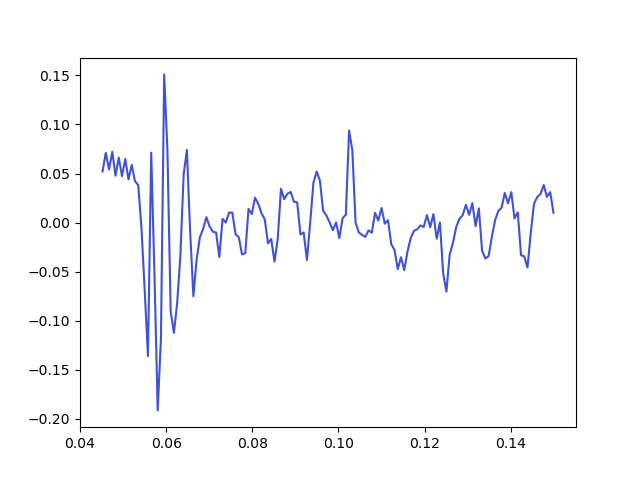

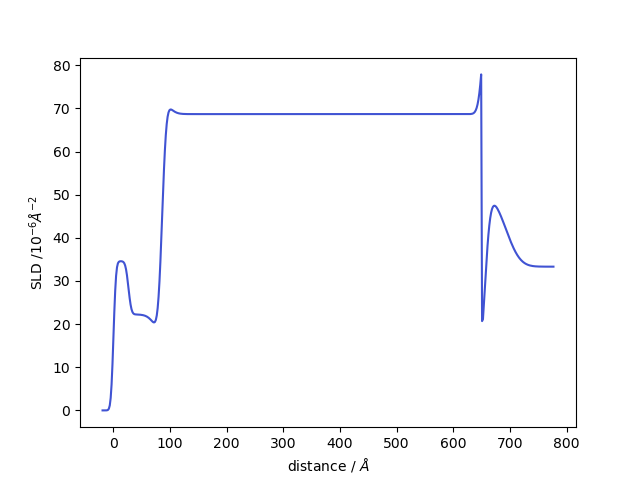

In [247]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6, 576, 1,5, np.inf], 
     'rough':[3.7,1.6,5,7.3,1,1,3], 
     'sld':[28, 20, 11, 65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/buff/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

1.0113510455907155: : 1000it [05:32,  3.01it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0        7.917142        7.190821          46.958900
 alox_1        9.416131        0.599933          35.311290
   al_2       40.316102        2.906075          13.399979
 buff_3       10.317645        0.556130          30.450067
 buff_4        8.653093       23.862041          12.018063
   nb_5      578.663259        5.889899          76.510067
 buff_6        0.371233        0.319882          16.085771
 alox_7       29.625553        5.864271          44.499523
al2o3_8             inf       17.594711          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 2.0105106699881174
Log10 Background               -9.0
 DQ - Resolution           1.483741
        Q Offset           0.011008
           Scale           1.220624


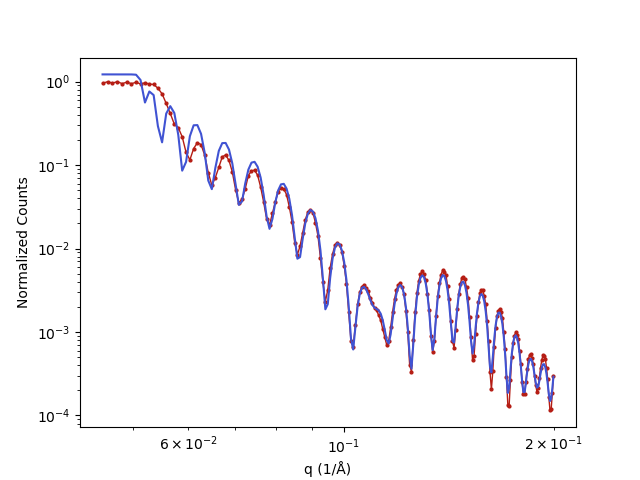

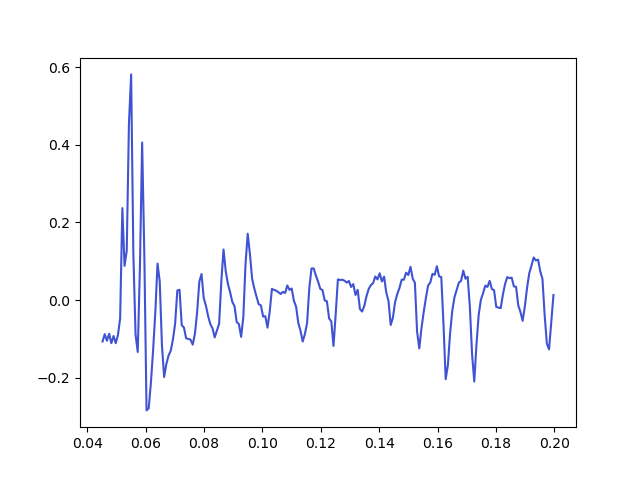

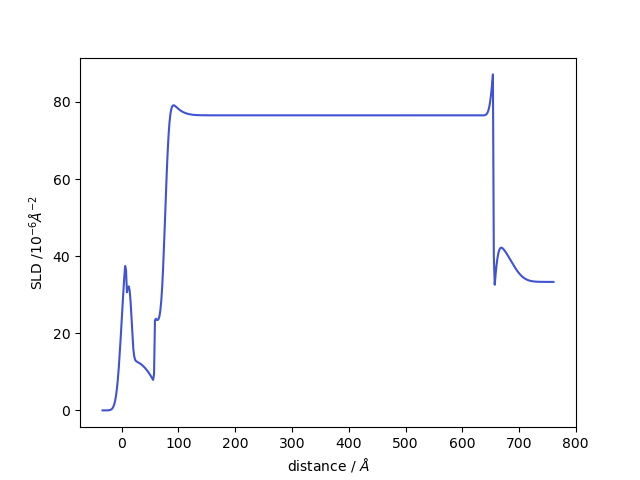

In [198]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11,10, 45, 5.6,5, 576, 1,5, np.inf], 
     'rough':[3.7,2,1.6,5,5,7.3,1,1,3], 
     'sld':[28, 28,20, 11, 11,65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.045, 0.2], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.5709276419358905: : 1000it [06:12,  2.69it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       11.762060        4.544062          52.730078
 alox_1       23.084205        6.903334          19.250099
   al_2       30.473224        4.677200          13.599255
 buff_3        8.826266       11.009170          25.114487
 buff_4        5.110896       16.055126          15.626389
   nb_5      551.386243        6.649276          78.760673
 buff_6       19.529940       23.431820           6.005003
 alox_7       12.560380        0.282373          51.807493
al2o3_8             inf        5.872973          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 1.1271968072880394
Log10 Background               -9.0
 DQ - Resolution            1.17197
        Q Offset           0.008005
           Scale           0.876933


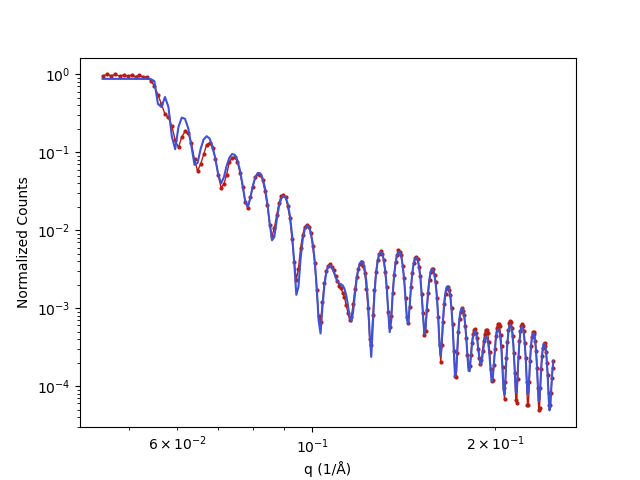

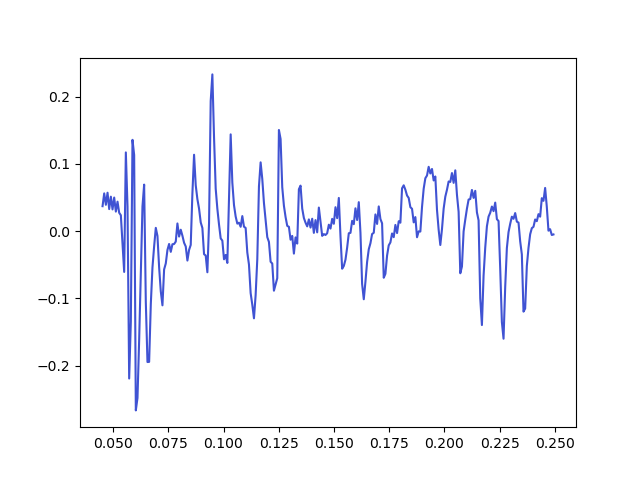

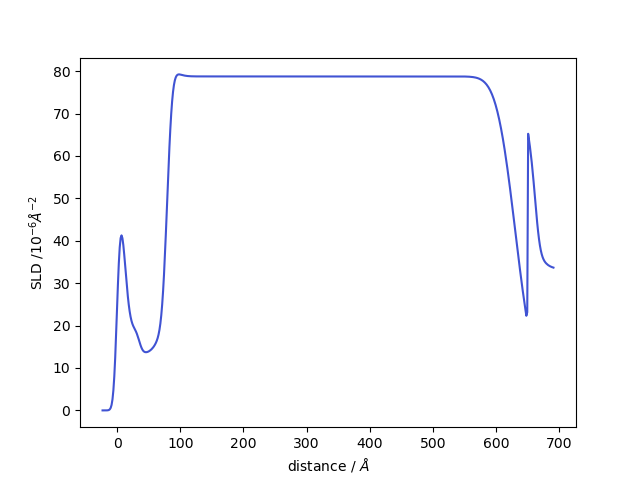

In [199]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.045, 0.25], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

1.4423425582569382: : 1000it [06:45,  2.46it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       20.522823        5.045737          50.423343
 alox_1       21.868303        8.486568          22.370355
   al_2       17.325626        0.789776          11.943881
 buff_3       13.133129       10.503302          15.529097
 buff_4        2.639069        4.267995          11.147025
   nb_5      571.808620        7.107433          92.859120
 buff_6        2.996073       16.963853           4.137536
 alox_7       39.604587        0.164645          57.836990
al2o3_8             inf       13.127849          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 2.7306640727635667
Log10 Background           -6.30103
 DQ - Resolution           0.988359
        Q Offset           0.019281
           Scale            1.31631


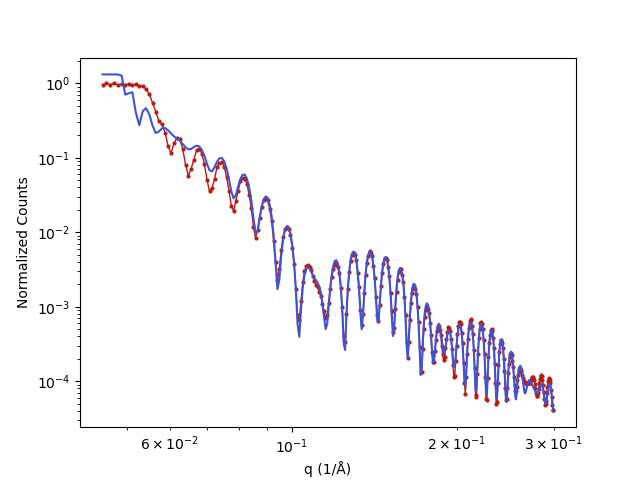

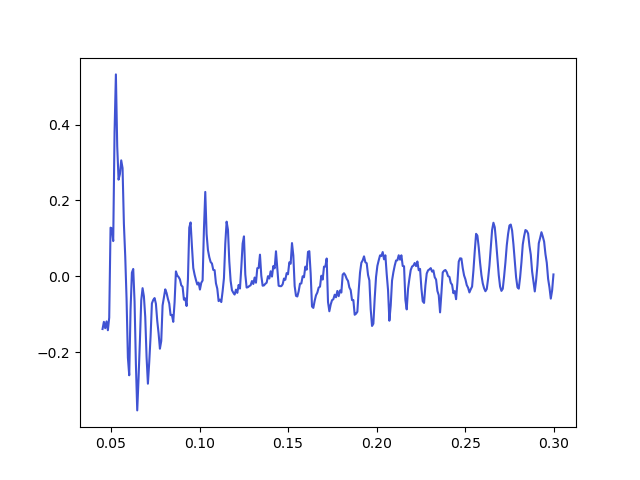

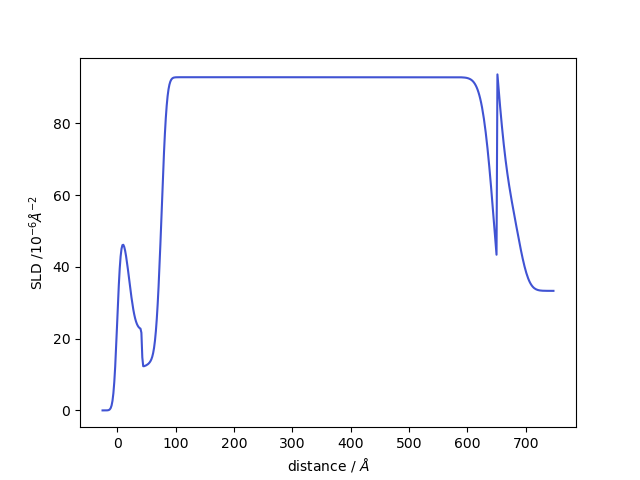

In [200]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.045, 0.3], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.31148907744284104: : 1000it [05:35,  2.98it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       11.513150        4.656506          36.167750
 alox_1       11.041190        4.913425          20.547331
   al_2       33.658941        1.055175          13.805066
 buff_3       18.807347        0.044424          23.821109
 buff_4        0.888216       19.884589           5.319329
   nb_5      562.518202        7.233401          74.699750
 buff_6       19.026861       24.559082           2.773700
 alox_7        4.344311        0.456330          50.265586
al2o3_8             inf        7.354409          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.5457356966249913
Log10 Background               -9.0
 DQ - Resolution           1.073084
        Q Offset           0.014869
           Scale            1.74776


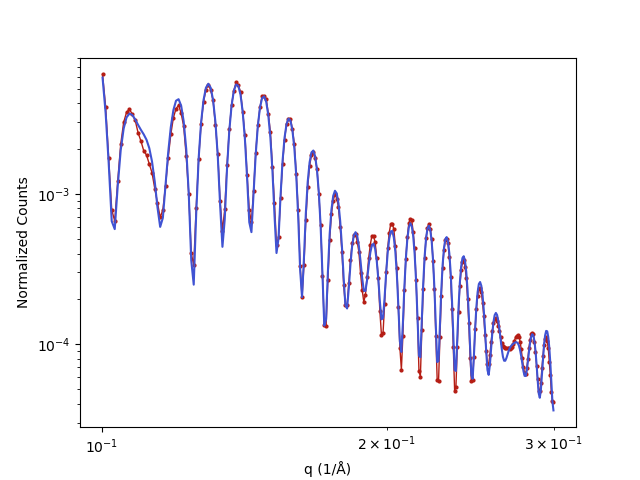

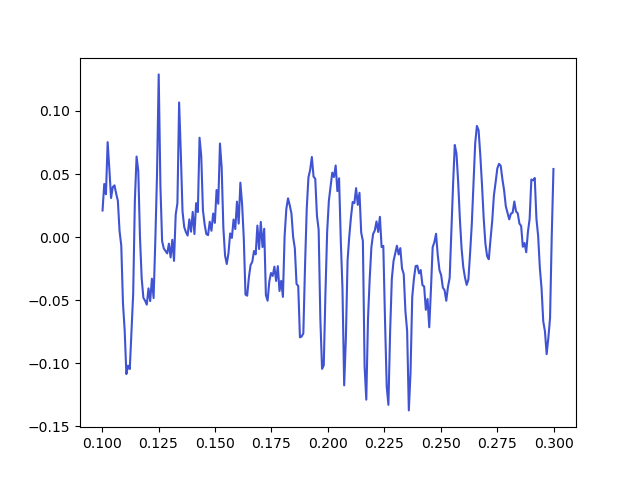

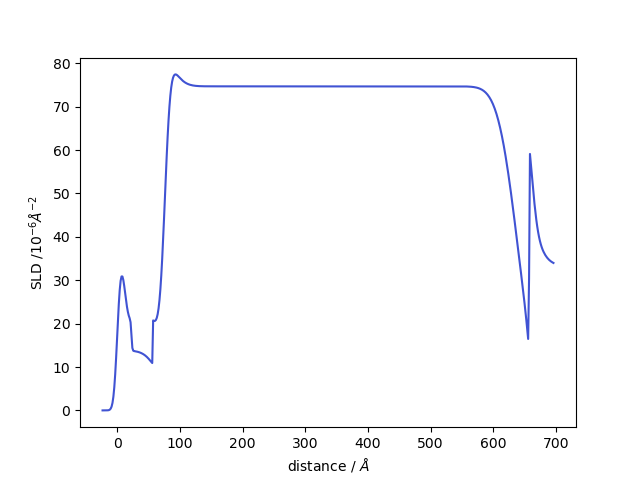

In [202]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.1, 0.3], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.405043354309641: : 1000it [05:31,  3.02it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       12.081816        5.288452          45.278513
 alox_1       23.228740        9.580490          15.568363
   al_2       22.535622        4.473417          24.367307
 buff_3       17.952939        4.285786          34.351780
 buff_4        5.903778       16.335585           6.011198
   nb_5      576.591376        7.016494          65.933587
 buff_6        5.689767        8.181956           3.237379
 alox_7       29.199598        1.177203          60.182366
al2o3_8             inf       19.841646          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.7869592234660232
Log10 Background               -9.0
 DQ - Resolution           1.150388
        Q Offset           0.002503
           Scale           1.068554


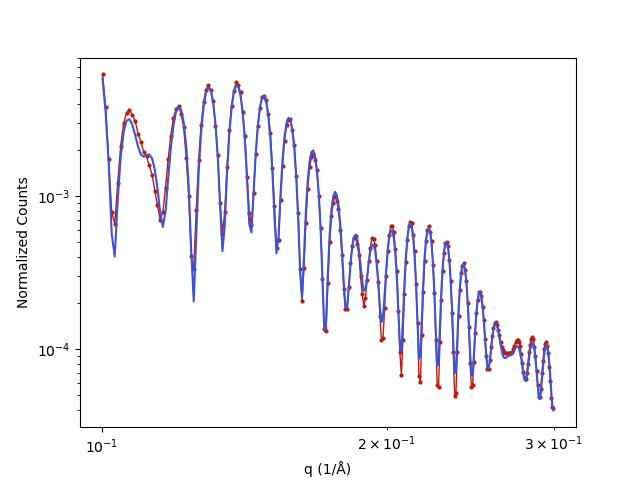

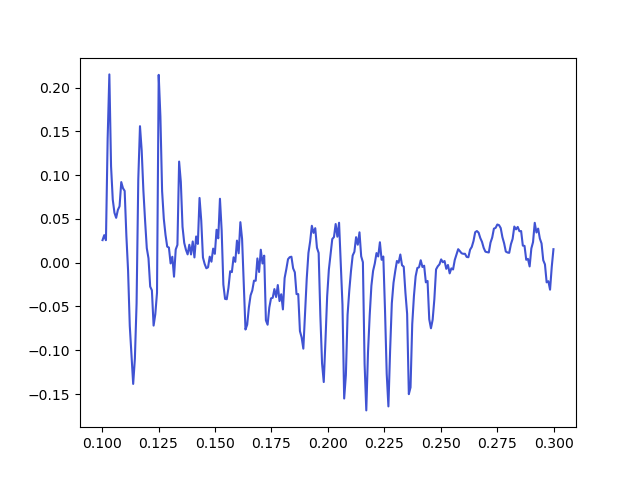

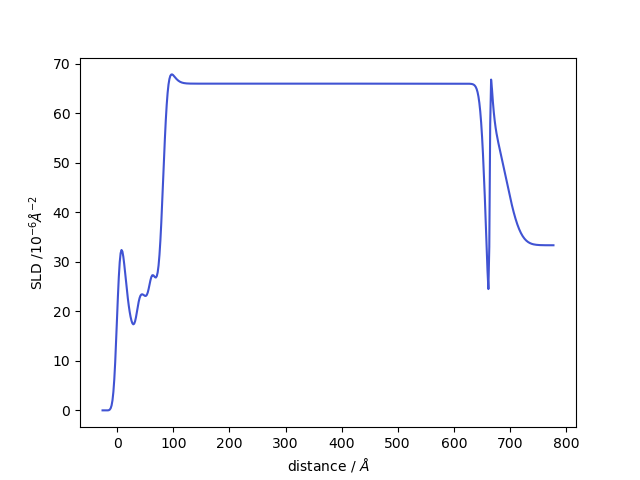

In [204]:
par = {'thk': np.array([ 11.51314952,  11.04118985,  33.65894142,  18.80734695,
          0.88821624, 562.51820216,  19.02686082,   4.34431092,
                 np.inf]),
 'rough': np.array([ 4.65650563,  4.91342519,  1.05517491,  0.04442419, 19.88458883,
         7.23340147, 24.55908237,  0.45632993,  7.3544091 ]),
 'sld': np.array([36.16774954, 20.5473306 , 20.80506607, 23.82110945,  5.3193289 ,
        64.69974987,  2.77370017, 50.2655857 , 33.319     ]),
 'scale': 1.7477602290015308,
 'bkg': 1e-09,
 'dq - resolution': 1.0730836252845635,
 'q_offset': 0.014869294193809017,
 'sub_rough_max': 20}


obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.1, 0.3], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.6849624451476068: : 1000it [05:30,  3.03it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       30.482560        4.181465          52.518213
 alox_1        0.234046        8.851330           8.496307
   al_2       20.735616        1.723114          29.010483
 buff_3       13.665719        5.097493          13.385663
 buff_4       11.717757       22.614513           8.239327
   nb_5      581.233089        5.256763          65.362003
 buff_6        6.354409       21.347119           2.060403
 alox_7        1.860935        0.354416          65.132883
al2o3_8             inf       13.251591          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 1.3518933139975422
Log10 Background           -6.30103
 DQ - Resolution             1.0446
        Q Offset           0.021467
           Scale           1.013064


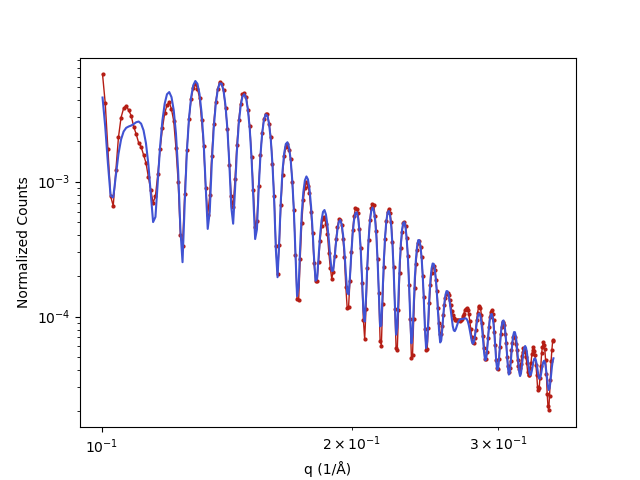

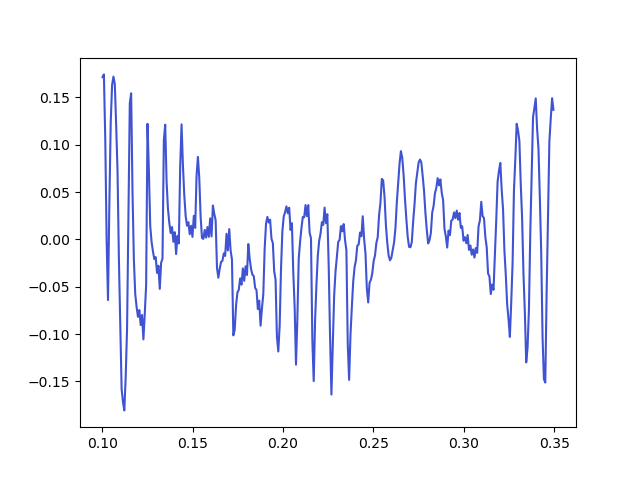

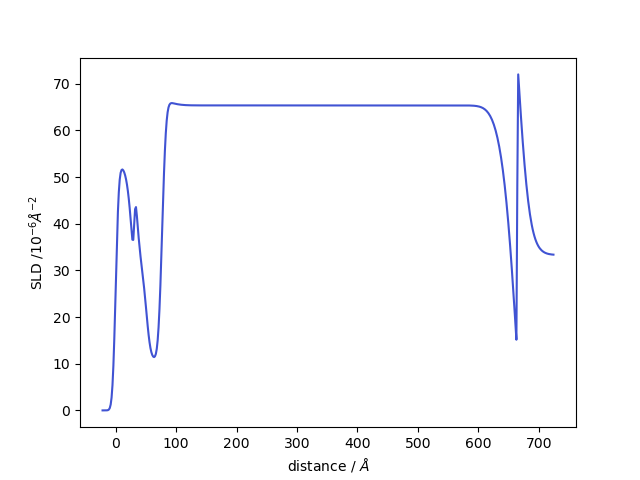

In [205]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.1, 0.35], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.9600261049423232: : 1000it [05:23,  3.10it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       10.889320        0.709252          22.224682
 alox_1        9.439540        7.257402          34.646390
   al_2       44.201761        0.345616          21.606973
 buff_3        2.158974       24.025615           3.481823
 buff_4       11.906428        3.668091          11.639578
   nb_5      588.133852        4.792573          53.679430
 buff_6        0.767808       23.592555           3.448903
 alox_7        4.751907        0.082025          49.593338
al2o3_8             inf        8.872599          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 1.8681087754898402
Log10 Background               -9.0
 DQ - Resolution           1.072995
        Q Offset           0.019663
           Scale           1.912251


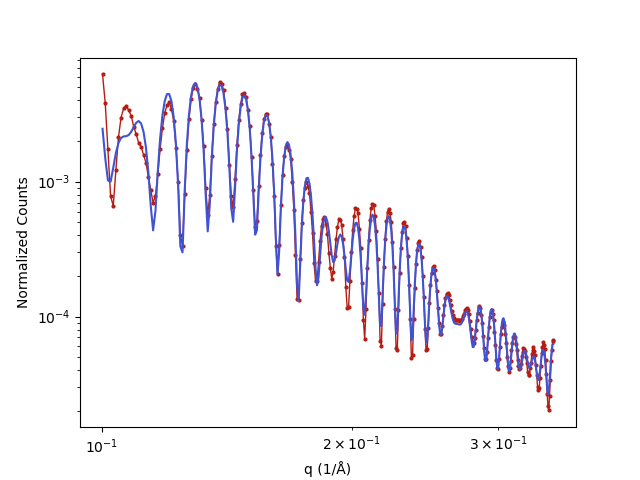

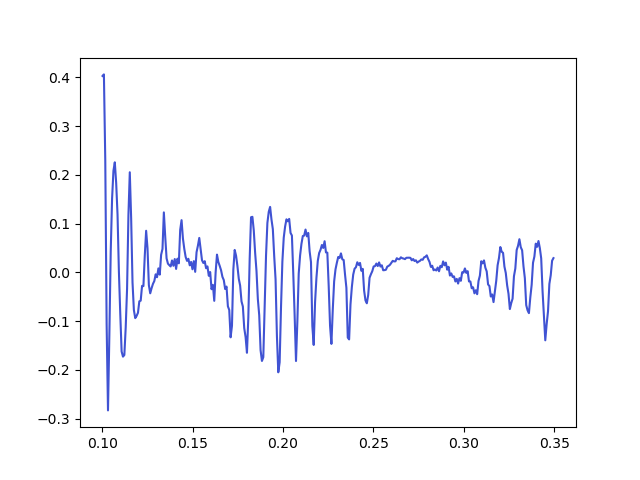

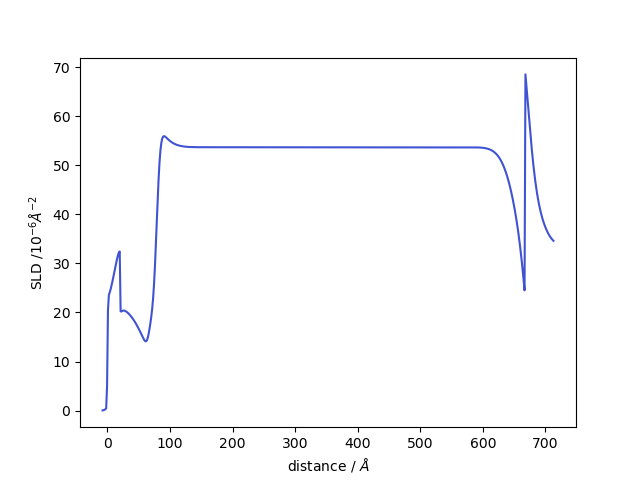

In [206]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par2, [0.1, 0.35], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.41250692324457605: : 1000it [06:19,  2.64it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       34.780649        8.489522          17.256415
 alox_1       20.721598        0.265064          40.847279
   al_2       24.342109        0.914401          25.855080
 buff_3       25.726578       11.095286           3.626439
 buff_4        9.527229        3.672912          17.232360
   nb_5      587.103292        3.899113          51.096165
 buff_6        2.173677        9.483037           1.857079
 alox_7       24.991391        1.660513          56.084781
al2o3_8             inf       10.718882          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.7960291825536346
Log10 Background               -9.0
 DQ - Resolution           0.896514
        Q Offset           0.018305
           Scale           1.776567


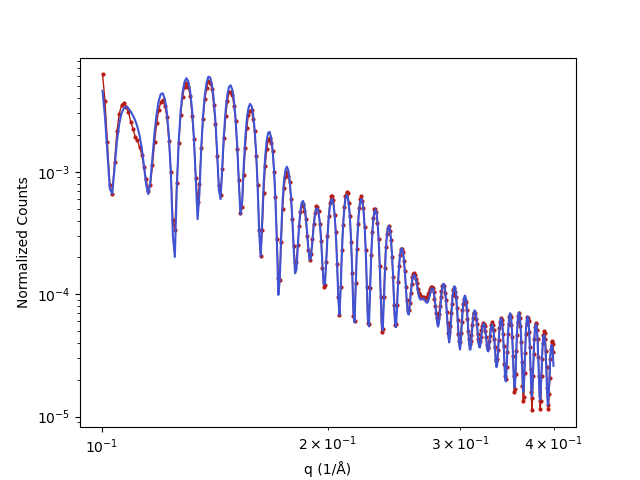

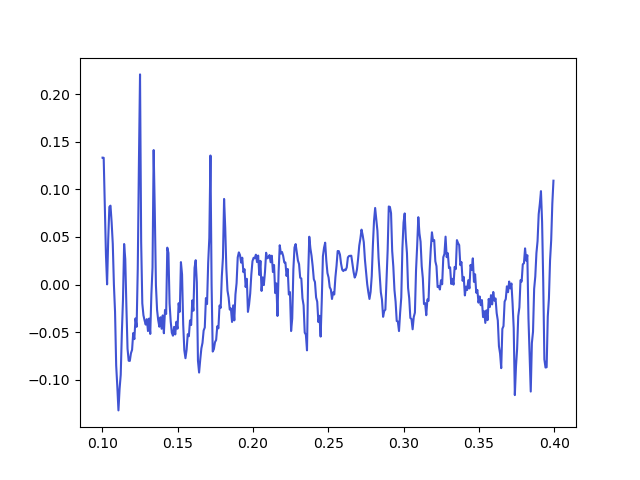

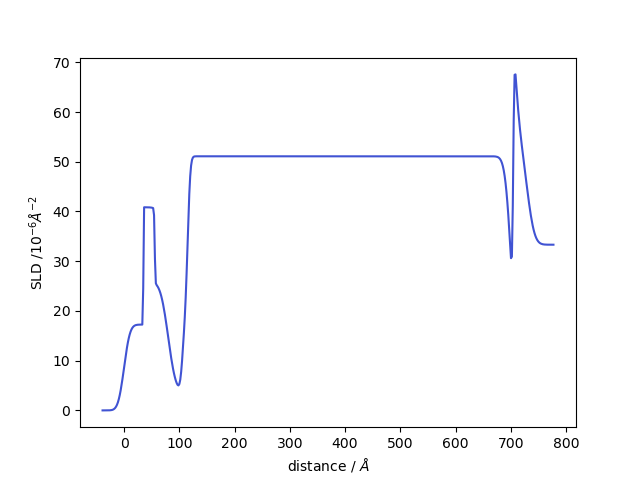

In [208]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.1, 0.4], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.645701010513491: : 1000it [06:03,  2.75it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       16.636359        0.069411          25.625200
 alox_1        3.458987        5.862541          42.479441
   al_2       45.531051        0.649650          23.041503
 buff_3        1.035555       23.564341           5.536262
 buff_4       14.633549       16.700227          16.864650
   nb_5      555.522884        6.143494          64.590211
 buff_6       25.269553       22.080973           7.153484
 alox_7        8.656845        0.511933          48.316403
al2o3_8             inf        3.888549          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 1.2164809741538432
Log10 Background               -9.0
 DQ - Resolution           0.951936
        Q Offset           0.013379
           Scale           1.639133


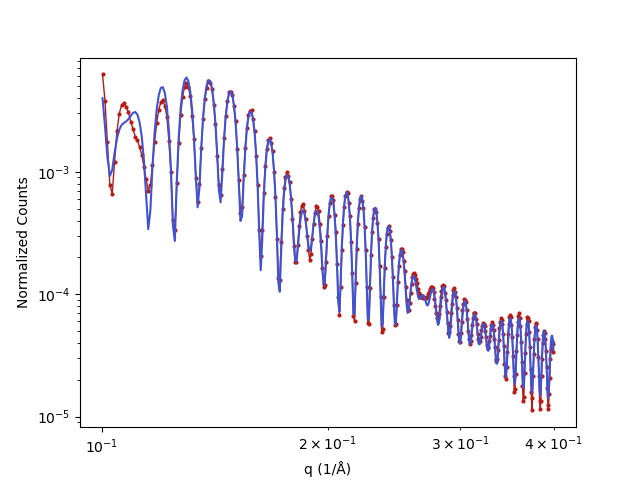

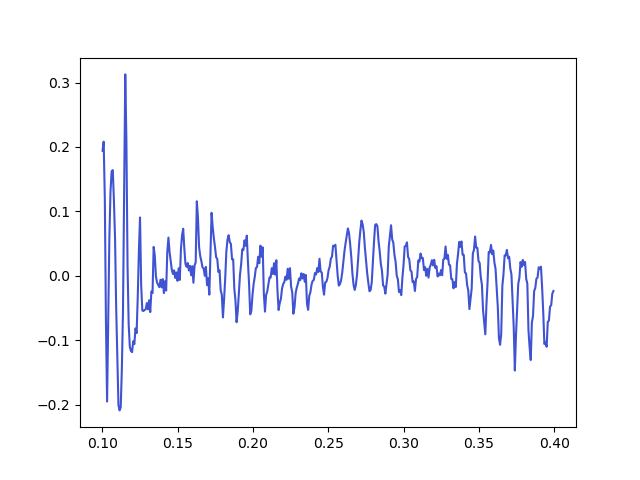

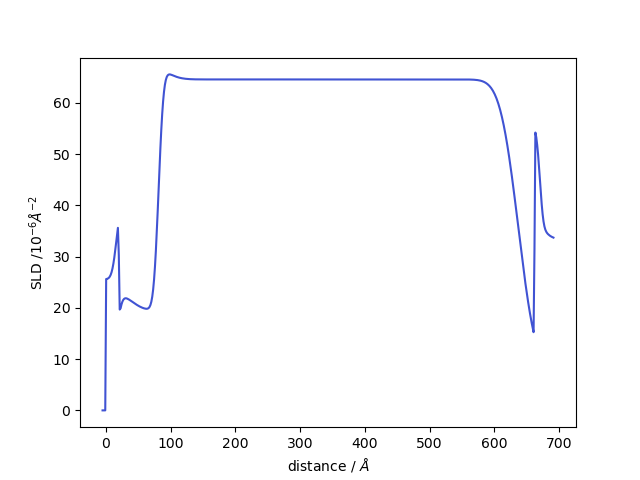

In [209]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par2, [0.1, 0.4], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.48636774695041746: : 1000it [07:46,  2.15it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       34.260228        8.499121          18.679284
 alox_1       20.567483        1.973461          44.473214
   al_2       23.620127        1.353114          26.609060
 buff_3       26.191054        9.627192           6.276799
 buff_4        8.289727        6.844730          27.712922
   nb_5      568.110593        5.032862          69.541992
 buff_6       17.129475       14.730470           8.996566
 alox_7        0.493475        1.738430          73.031333
al2o3_8             inf        7.998835          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 0.9423601379886719
Log10 Background          -7.143401
 DQ - Resolution           0.852289
        Q Offset           0.022175
           Scale           1.509804


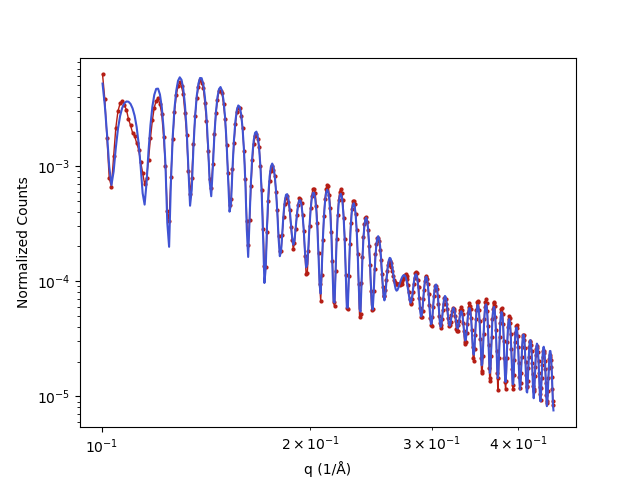

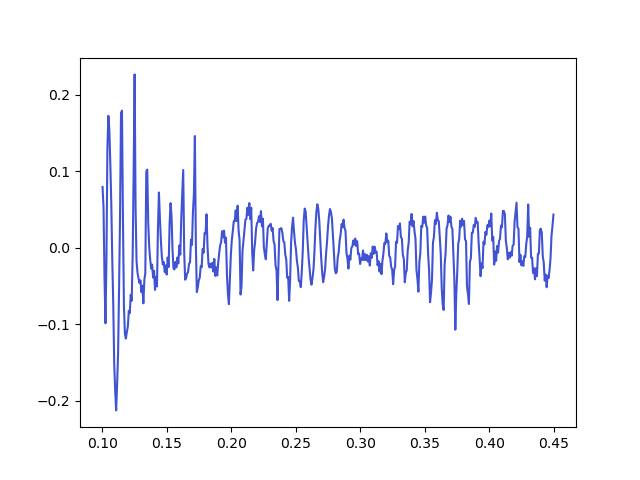

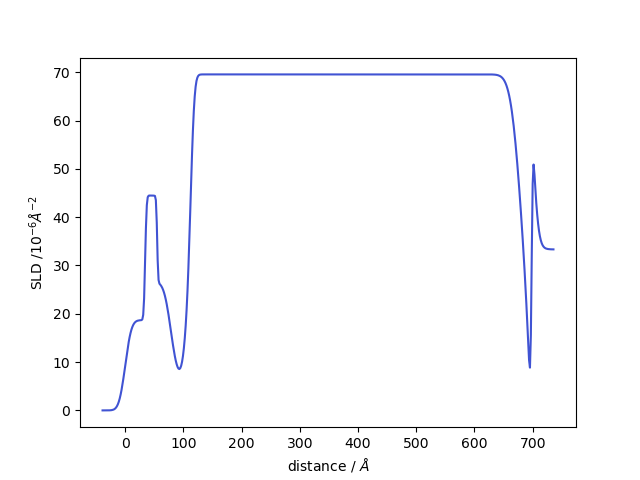

In [211]:

obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.1, 0.45], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.6495806707851681: : 1000it [07:05,  2.35it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       33.030967        8.964555          23.574399
 alox_1       21.239004        2.395594          54.104474
   al_2       21.721141        2.728310          30.947690
 buff_3       27.158526        9.300570           3.571565
 buff_4        9.123627        5.608802          18.577019
   nb_5      579.863531        5.136482          68.371208
 buff_6        6.579693        7.104217          14.256545
 alox_7       37.834310        0.689356          69.854468
al2o3_8             inf       16.288525          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 1.2300114251273508
Log10 Background          -6.363523
 DQ - Resolution            0.84776
        Q Offset           0.021168
           Scale           1.287785


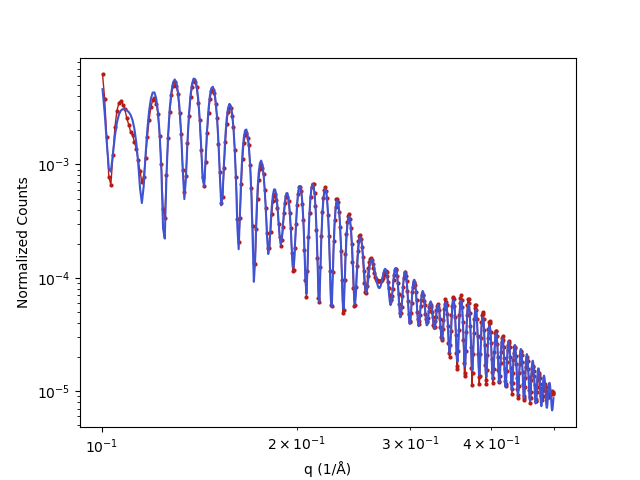

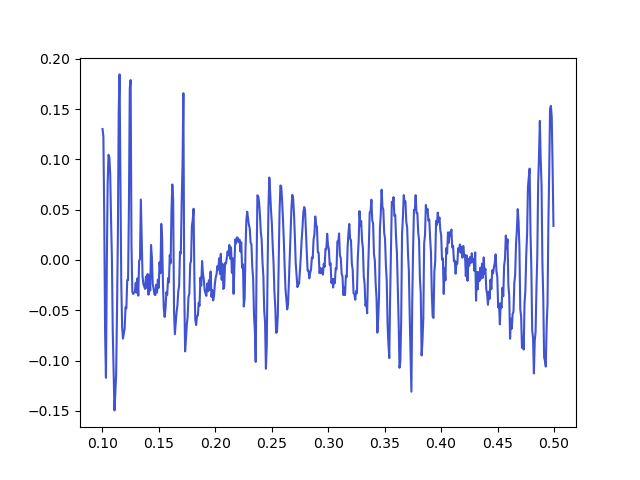

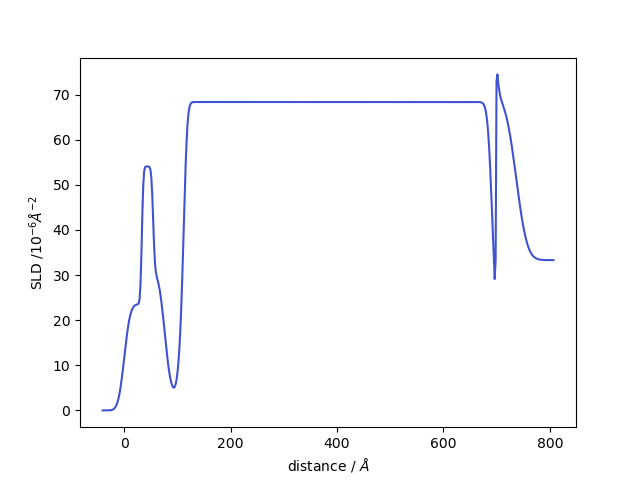

In [213]:
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/buff/nb/buff/alox/al2o3', par, [0.1, 0.5], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.658241764888854: : 1000it [08:44,  1.91it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0        7.178618        0.378230          25.837173
 alox_1       16.689650        1.495277          38.858116
   al_2       24.164646        0.306690          22.682251
 buff_3       28.777583        8.995272           5.736438
   nb_4        2.790455        7.783103          53.516386
 buff_5        5.427818        9.540165           3.625030
   nb_6      578.134862        6.023100          67.668933
 buff_7        3.132515        0.156702           7.313318
 alox_8       19.617036        8.344387          35.774790
al2o3_9             inf        5.556387          33.319000

Additional Parameters:
       Parameter             Value
           Chisq 1.204232944534422
Log10 Background         -6.631742
 DQ - Resolution          0.817079
        Q Offset          0.009305
           Scale          0.986342


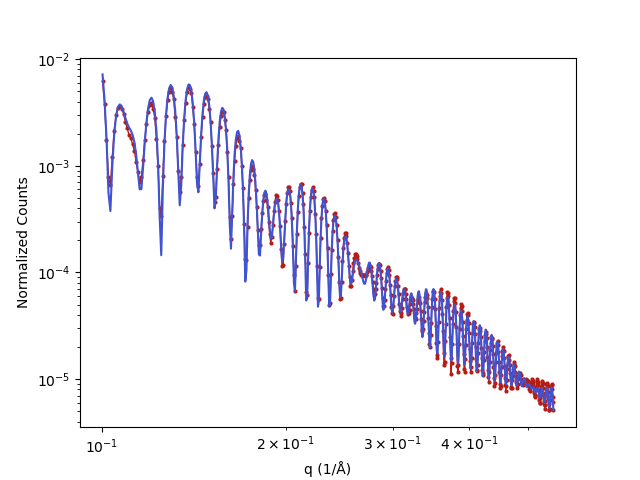

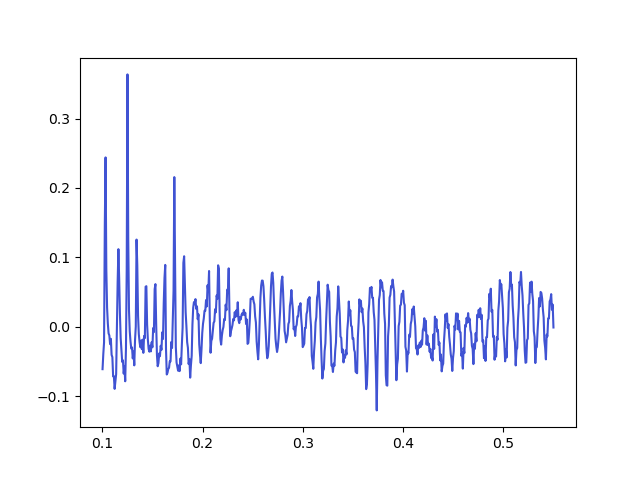

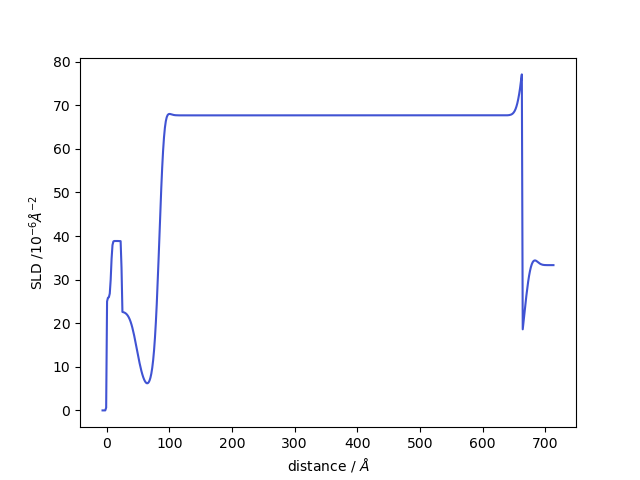

In [214]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11,10, 45, 5,5,5, 576, 1,5, np.inf], 
     'rough':[3.7,2,1.6,5,5,5,7.3,1,1,3], 
     'sld':[28, 28,20, 11, 65,11,65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/nb/buff/nb/buff/alox/al2o3', par2, [0.1, 0.55], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

5.229902289051536: : 876it [08:09,  1.79it/s] 


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       33.531474        8.825199          16.653127
 alox_1       31.359353        8.594477          31.788815
   al_2       33.831344        7.077433          23.754041
 buff_3       16.735372        3.552657           6.455543
   nb_4        5.985366        0.537751          67.923994
 buff_5       29.899192        4.610094           8.555896
   nb_6      602.313871        7.911254          71.058863
 buff_7       29.948934        2.027610          43.113632
 alox_8        1.659713        1.207778          16.559245
al2o3_9        5.000000        8.936703          30.000000

Additional Parameters:
       Parameter              Value
           Chisq 10.447723179748573
Log10 Background          -7.262192
 DQ - Resolution           0.768346
        Q Offset           0.024775
           Scale            1.00057


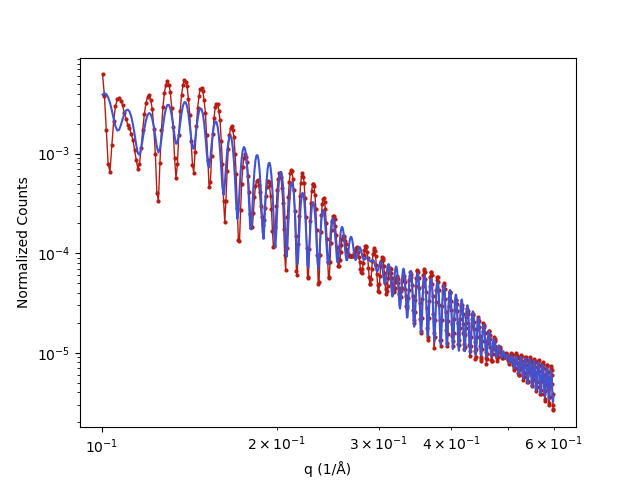

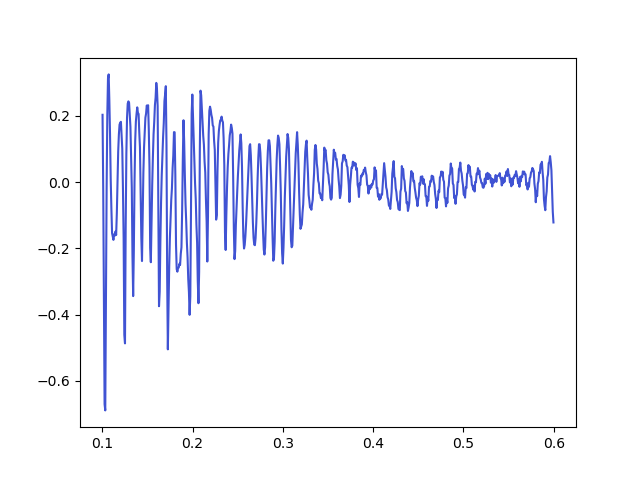

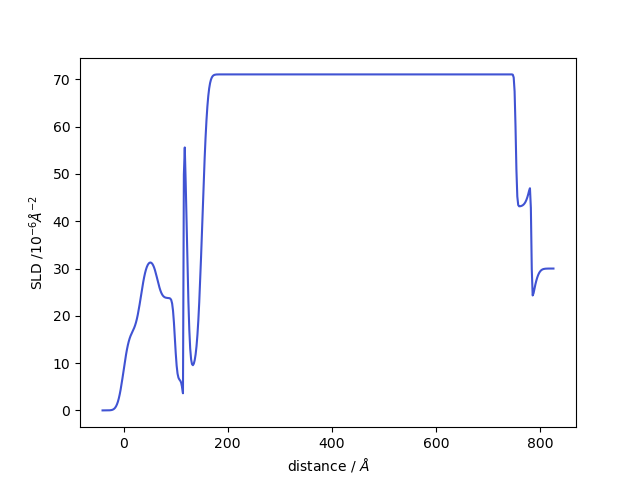

In [235]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11,10, 45, 5,5,5, 576,5, 1,5, np.inf], 
     'rough':[3.7,2,1.6,5,5,5,7.3,1,1,1,3], 
     'sld':[28, 28,20, 11, 65,11,65,30, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/nb/buff/nb/buff/alox/al2o3', par2, [0.1, 0.6], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

0.6301124960005791: : 1000it [08:07,  2.05it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       18.265245        9.515600          20.262175
 alox_1       25.517519        9.150302          61.207449
   al_2       30.511637        2.196551          25.509949
 buff_3       26.057561        1.225285           3.477862
   nb_4        7.040726        7.987872          36.932871
 buff_5       26.445887       23.926023           6.032472
   nb_6      575.517678        6.136981          76.567865
 buff_7        6.945365        0.161933           9.992417
 alox_8       23.633992        5.056940          31.072154
al2o3_9             inf        0.123727          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 1.2570351476062176
Log10 Background          -6.525053
 DQ - Resolution           0.807622
        Q Offset           0.022091
           Scale           0.829082


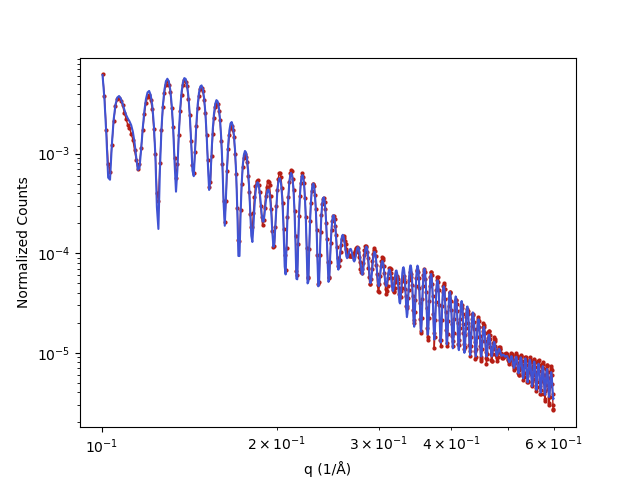

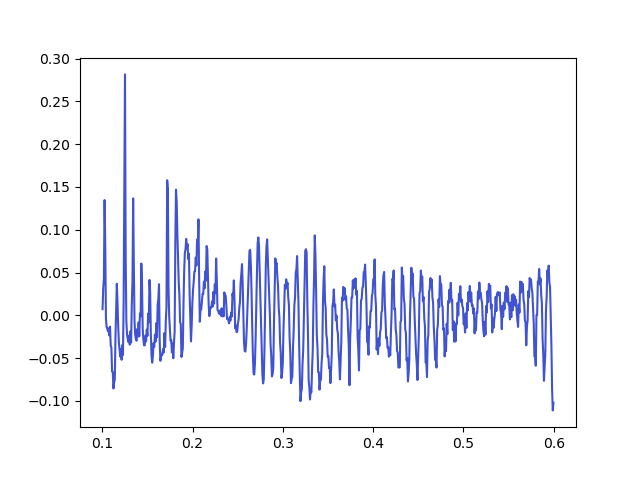

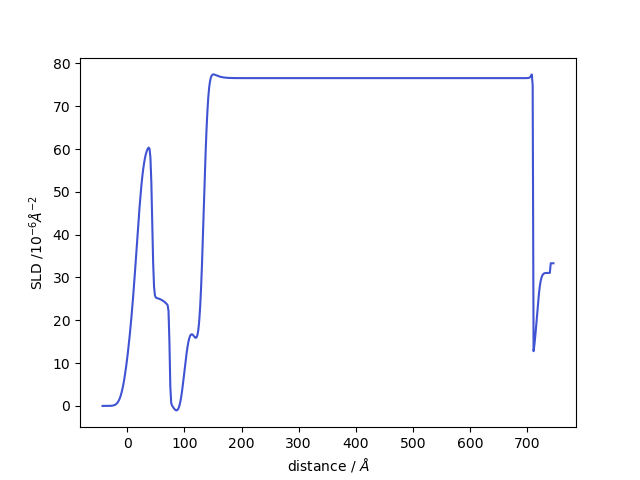

In [222]:
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/nb/buff/nb/buff/alox/al2o3', par, [0.1, 0.6], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

1.8498766538690297: : 1000it [10:56,  1.52it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       36.380356        9.347338          17.081178
 alox_1       22.252330        2.554805          48.003970
   al_2       42.857494        2.280076          28.839531
 buff_3        2.209547       22.150717           1.638377
   nb_4       10.122191        7.939954          36.498362
 buff_5        2.999301       21.741622           2.687619
   nb_6      582.626087        5.816717          67.939942
 buff_7        6.208848        0.445859          11.084232
 alox_8       31.562304        5.560509          31.145195
al2o3_9             inf        1.912183          33.319000

Additional Parameters:
       Parameter              Value
           Chisq 3.6905310952352925
Log10 Background          -6.325939
 DQ - Resolution           0.788477
        Q Offset           0.018378
           Scale           1.187405


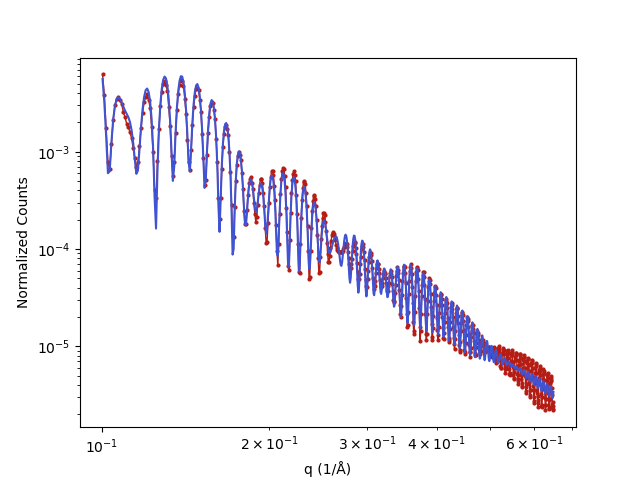

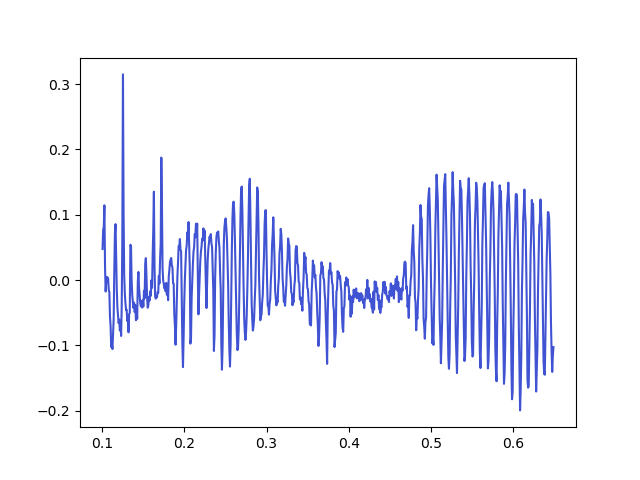

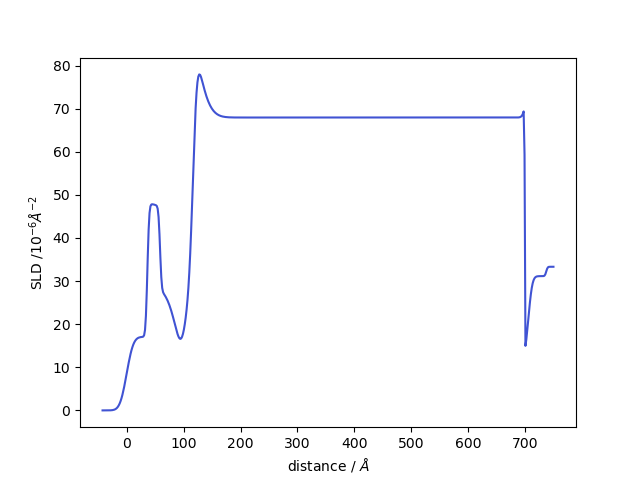

In [223]:
obj, par = ana_xrr.sim(pth + flist[13], 'alox/alox/al/buff/nb/buff/nb/nbox/buff/alox/al2o3', par, [0.1, 0.65], SLD_rng=[0.7,0.2], fit=True)
ana_xrr.generate_table(par)

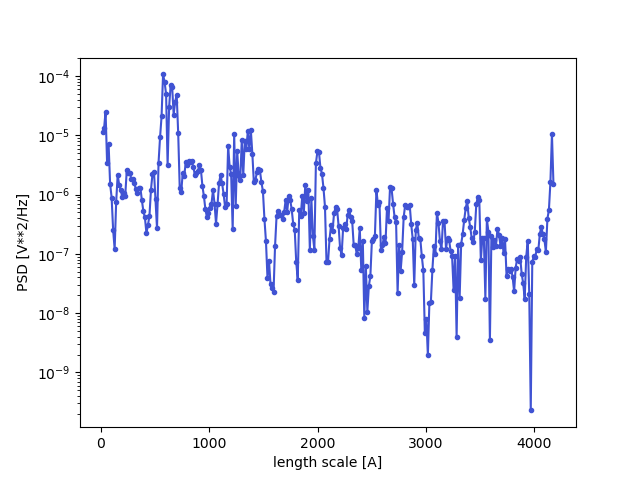

In [219]:
obj1=obj
from scipy import signal
plt.figure()
fs = 1/((max(obj1.data.x) - min(obj1.data.x)) / len(obj1.data.x))
f, Pxx_den = signal.periodogram(obj1.residuals(), fs)
plt.semilogy(f[1:]*2*np.pi, Pxx_den[1:],'.-')
#plt.ylim([1e-9, 1e0])
plt.xlabel('length scale [A]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

In [218]:
obj.data.y

array([6.24140479e-03, 3.80592585e-03, 1.73620601e-03, 7.82987804e-04,
       6.59921773e-04, 1.21272128e-03, 2.13547243e-03, 2.98943515e-03,
       3.49984116e-03, 3.65658111e-03, 3.38386923e-03, 3.08022884e-03,
       2.55275988e-03, 2.25026932e-03, 1.93899585e-03, 1.81300016e-03,
       1.58541540e-03, 1.38167661e-03, 1.08610230e-03, 8.70042354e-04,
       6.98392965e-04, 7.81213394e-04, 1.13301656e-03, 1.74211628e-03,
       2.48573514e-03, 3.21921831e-03, 3.68438471e-03, 3.88733248e-03,
       3.43896774e-03, 2.81637148e-03, 1.78389046e-03, 1.00102403e-03,
       4.03894253e-04, 3.34925641e-04, 8.08232201e-04, 1.71234785e-03,
       2.92356494e-03, 4.10258968e-03, 4.93931740e-03, 5.34315087e-03,
       4.90042237e-03, 4.18702827e-03, 2.87246965e-03, 1.84833723e-03,
       8.95829651e-04, 5.68154025e-04, 7.90467592e-04, 1.55267722e-03,
       2.69319689e-03, 3.90603137e-03, 4.86619564e-03, 5.52485572e-03,
       5.29498224e-03, 4.78557533e-03, 3.52313023e-03, 2.45643066e-03,
      

1.1265173721544701: : 1000it [06:44,  2.47it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0        0.640759        1.570992          35.590255
   al_1       58.905169        5.391205          21.691916
 buff_2       27.664536       14.337492           5.979580
 buff_3        0.624469       18.450337          13.233930
   nb_4      575.027969        1.215426          64.348069
 buff_5        6.672383        0.413807           4.153350
 alox_6       13.577644        1.929227          56.860673
al2o3_7             inf        0.714463          33.319000

Additional Parameters:
      Parameter             Value
          Chisq 2.246773372278865
     Background               0.0
DQ - Resolution               0.5
       Q Offset          0.001111
          Scale          0.856479


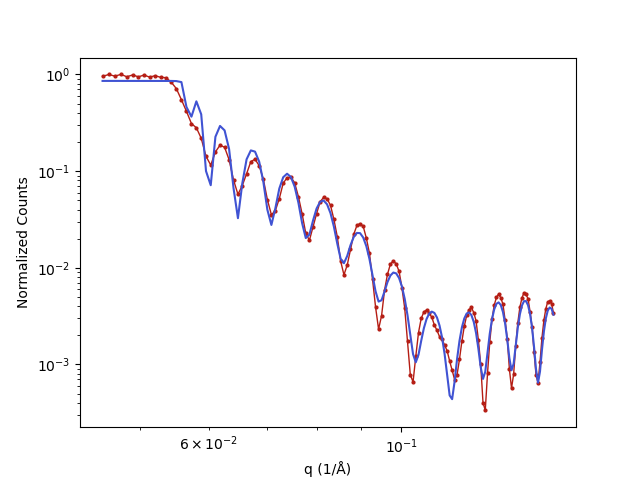

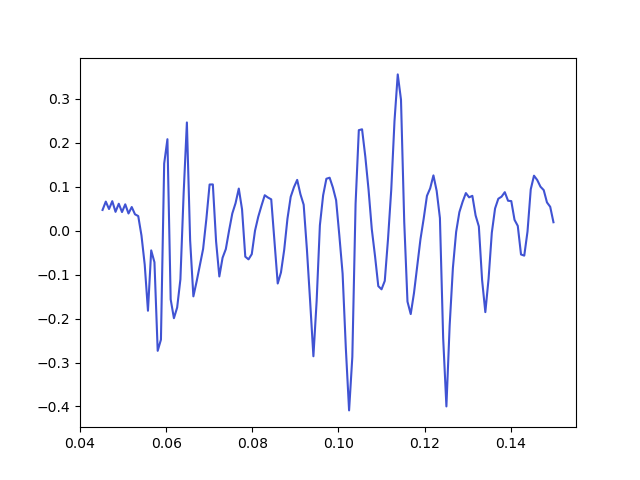

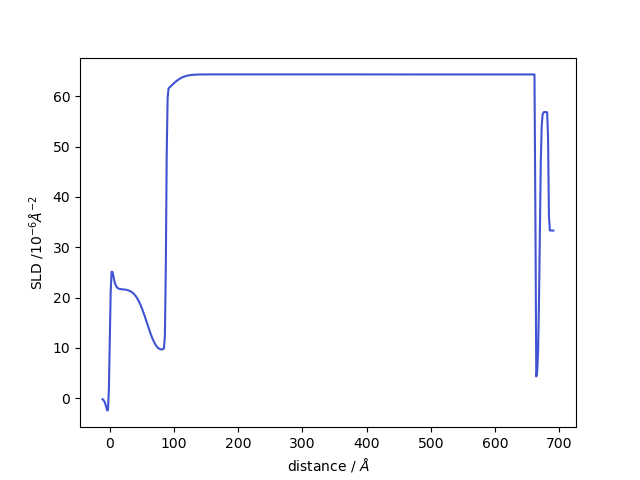

In [190]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6,5, 576, 1,5, np.inf], 
     'rough':[3.7,1.6,5,5,7.3,1,1,3], 
     'sld':[ 28,20, 11, 11,65, 11, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/buff/nb/buff/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.9,0.3], fit=True)
ana_xrr.generate_table(par)

0.8175895492700038: : 969it [06:03,  2.66it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       10.690032        1.596654          35.502323
   al_1       24.248414        0.131012          17.985130
 buff_2       26.624585       13.204980           3.370323
 buff_3       28.227411       16.797570           3.550691
   nb_4      568.107780        3.703363          45.504867
 alox_5       21.704315        0.691959          56.940973
al2o3_6             inf        0.127670          33.319000

Additional Parameters:
      Parameter              Value
          Chisq 1.6329619152956445
     Background                0.0
DQ - Resolution                0.5
       Q Offset          -0.007163
          Scale           0.873076


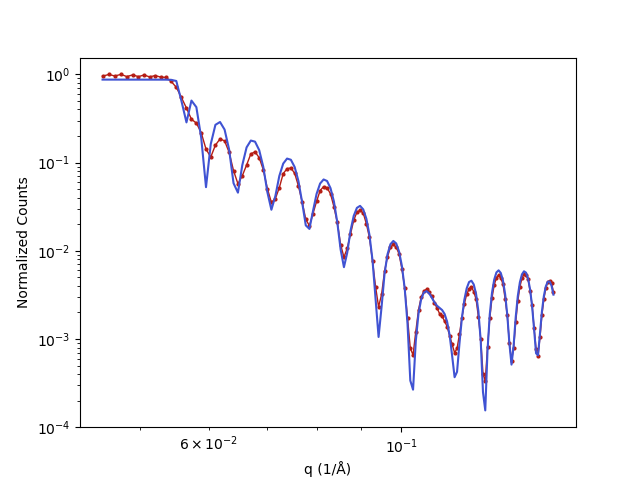

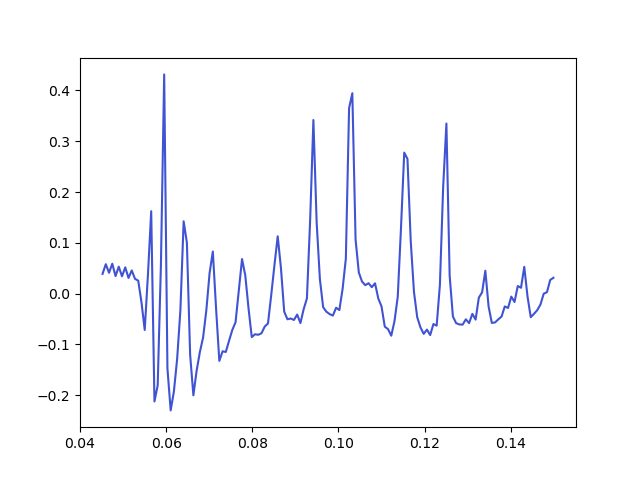

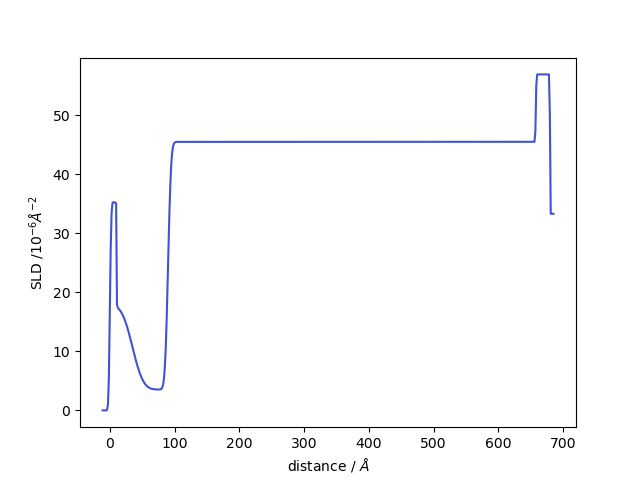

In [191]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6,5, 576, 5, np.inf], 
     'rough':[3.7,1.6,5,5,7.3,1,3], 
     'sld':[ 28,20, 11, 11,65, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/buff/nb/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.9,0.3], fit=True)
ana_xrr.generate_table(par)

0.3061937002928568: : 1000it [03:37,  4.60it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       26.066473        3.446817          29.528002
   al_1       32.432317        0.903259          16.261866
 buff_2        0.297935       11.842120          17.760374
 buff_3       29.069946       19.070578           7.268677
   nb_4      577.377161        5.856771          57.001038
 alox_5       12.057785        1.043348          18.732747
al2o3_6             inf        2.682425          33.319000

Additional Parameters:
      Parameter              Value
          Chisq 0.6107642472911197
     Background                0.0
DQ - Resolution           1.750368
       Q Offset          -0.001547
          Scale           0.833907


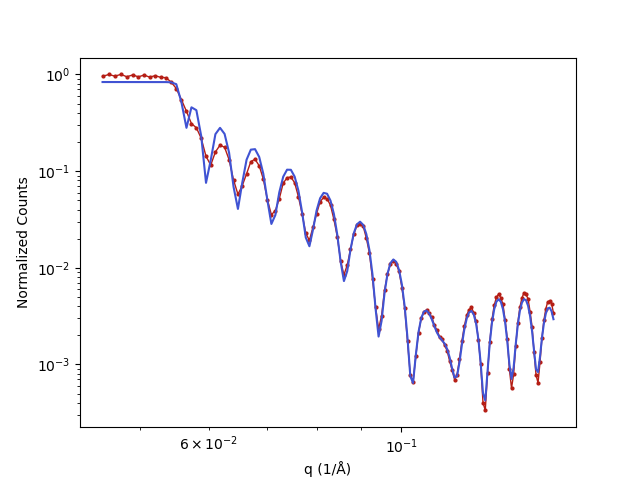

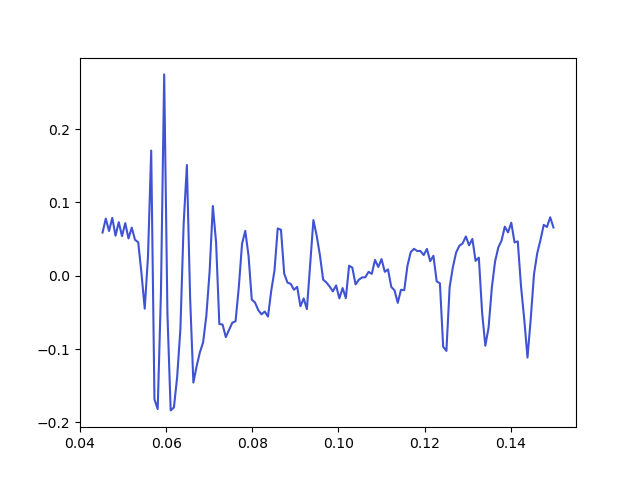

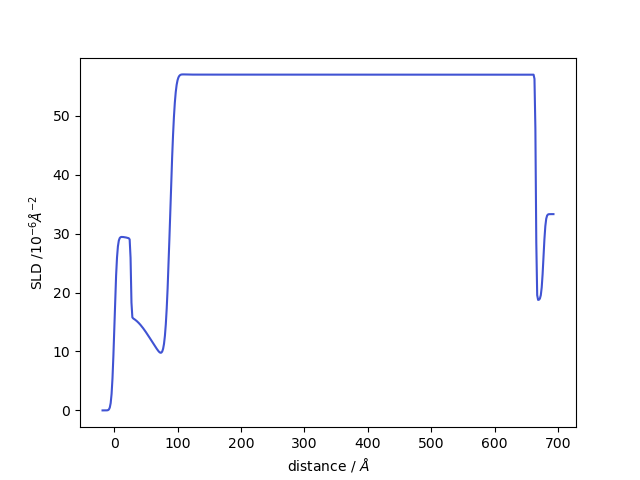

In [193]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5.6,5, 576, 5, np.inf], 
     'rough':[3.7,1.6,5,5,7.3,1,3], 
     'sld':[ 28,20, 11, 11,65, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/buff/nb/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.9,0.3], fit=True)
ana_xrr.generate_table(par)

1.4540392454299882: : 565it [02:38,  3.57it/s]


Layer Properties:
  Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
 alox_0       21.991430        8.581682          30.141164
   al_1       43.890975        1.303464          21.139505
 buff_2       18.767730       17.730769           4.273315
   nb_3      562.548898        2.780759          67.555212
 alox_4       30.000000        0.659144          43.487326
al2o3_5             inf        8.227526          33.319000

Additional Parameters:
      Parameter              Value
          Chisq 2.9016844465591856
     Background                0.0
DQ - Resolution                0.5
       Q Offset           0.002512
          Scale           0.821109


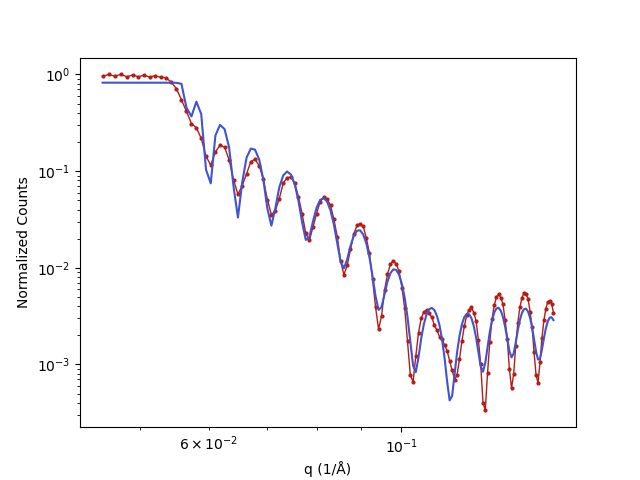

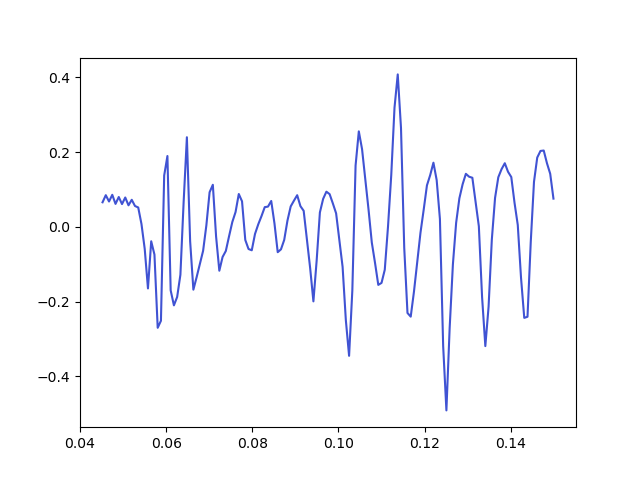

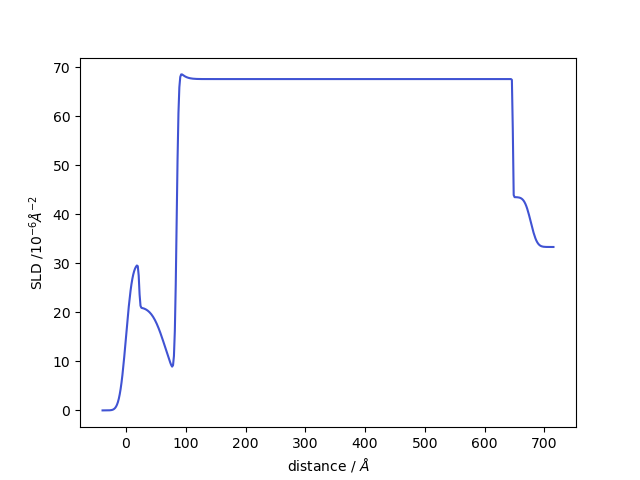

In [192]:
par2={'scale':1, 'bkg':5e-9, 'q_offset':0, 'dq - resolution':0.5, 'sub_rough_max':20, 
     'thk':[11, 45, 5, 576, 5, np.inf], 
     'rough':[3.7, 1.6, 5, 7.3,1,3], 
     'sld':[ 28,20, 11,65, 30,33.319]}
obj, par = ana_xrr.sim(pth + flist[13], 'alox/al/buff/nb/alox/al2o3', par2, [0.045, 0.15], SLD_rng=[0.9,0.3], fit=True)
ana_xrr.generate_table(par)

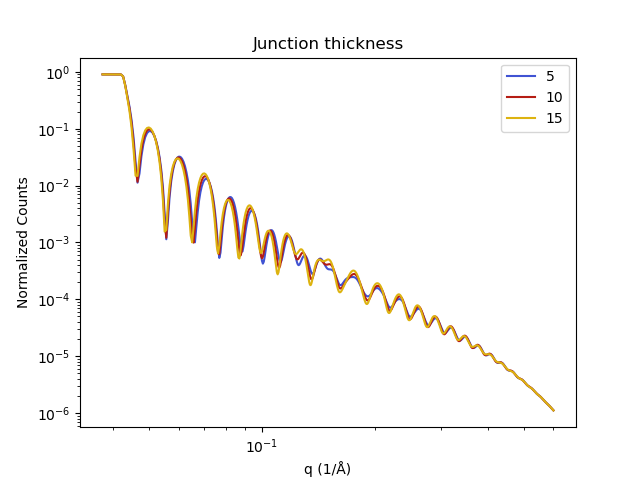

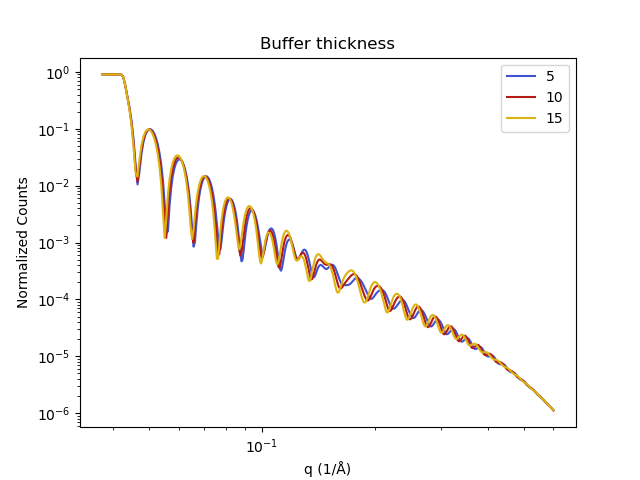

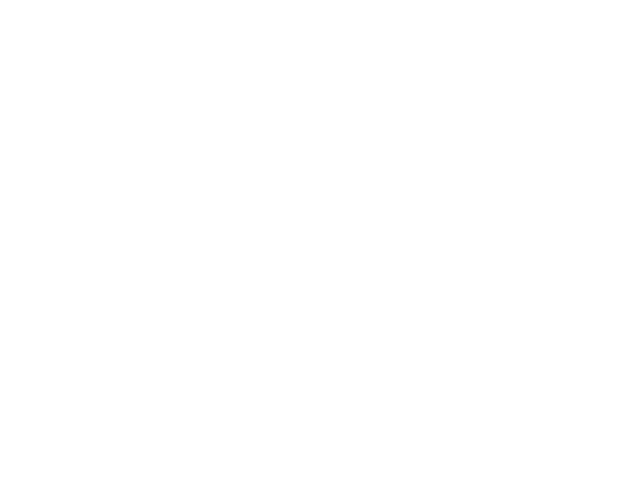

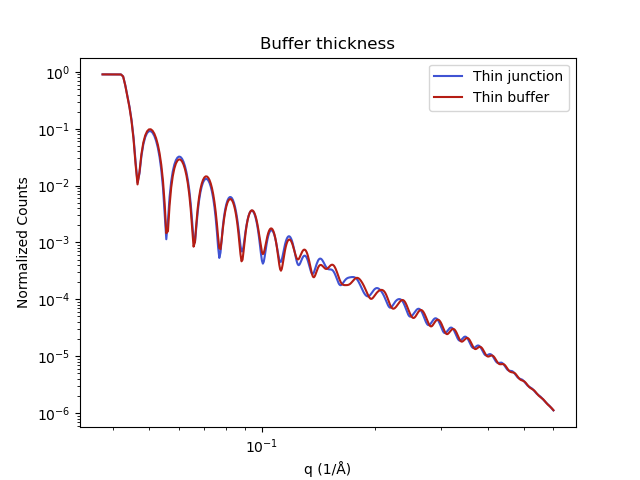

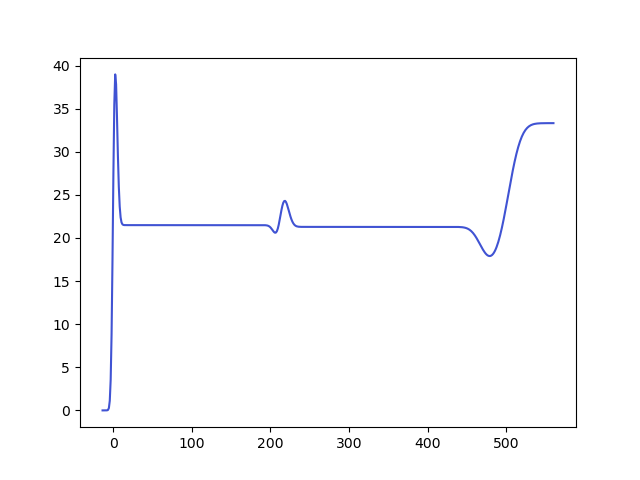

In [93]:
qrng = [0.0375, 0.6]
q = np.linspace(qrng[0],qrng[1], 1001)

par4['thk'][3]=5
structure, model = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
par4['thk'][3]=9.3
structure, model2 = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
par4['thk'][3]=14
structure, model3 = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
plt.figure()
#plt.plot(data.x, data.y, 'k', label='Data')
plt.loglog(q, model(q), label='5')
plt.loglog(q, model2(q), label='10')
plt.loglog(q, model3(q), label='15')
plt.xlabel('q (1/Å)')
plt.ylabel('Normalized Counts')
plt.title('Junction thickness')
plt.legend()

par4['thk'][3]=9.3

par4['thk'][2]=5
structure, model = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
par4['thk'][2]=9.3
structure0, model2 = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
par4['thk'][2]=14
structure, model3 = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
plt.figure()
#plt.plot(data.x, data.y, 'k', label='Data')
plt.loglog(q, model(q), label='5')
plt.loglog(q, model2(q), label='10')
plt.loglog(q, model3(q), label='15')
plt.title('Buffer thickness')
plt.xlabel('q (1/Å)')
plt.ylabel('Normalized Counts')
plt.legend()
par4['thk'][2]=9.3


plt.figure()
par4['thk'][3]=5
structure, model = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
par4['thk'][3]=9.3
par4['thk'][2]=5
structure0, model2 = ana_xrr.make_model_par('alox/al/buff/alox/al/buff/al2o3',par4)
plt.figure()
#plt.plot(data.x, data.y, 'k', label='Data')
plt.loglog(q, model(q), label='Thin junction')
plt.loglog(q, model2(q), label='Thin buffer')
plt.title('Buffer thickness')
plt.xlabel('q (1/Å)')
plt.ylabel('Normalized Counts')
plt.legend()
par4['thk'][2]=9.3


#data = ana_xrr.loadRefData(pth + flist[1],qrng=qrng)

plt.figure()
plt.plot(*structure0.sld_profile())


In [88]:
ana_xrr.generate_table(par4)

Layer Properties:
      Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
   AlOx_top        3.998512        2.137924          55.886010
     Al_top      203.206556        2.796637          21.489530
Buff_JJ_top       14.000000        4.847828          16.952165
    AlOx_JJ        5.000000        4.771530          26.738173
         Al      246.332183        5.316515          21.285301
Buff_JJ_bot       34.721122        9.971072          16.697278
  Substrate             inf       13.127675          33.319000

Additional Parameters:
      Parameter              Value
          Chisq 0.2532430196321745
     Background                0.0
DQ - Resolution                2.0
       Q Offset           -0.00184


### Load all the files in 

In [23]:
flist_lv = glob.glob('lv*.txt', root_dir=pth)
flist_lv.sort()
print(flist_lv)

labs_lv = ['67 nm Al', '30 nm Al/AlOx/37 nm Al', 'Slow 50 nm Al/5x AlOx/20 nm Al', 'Fast 50 nm Al/5x AlOx/20 nm Al','80 nm Ta/8 nm Al/AlOx/50 nm Al','80 nm Ta/8 nm Al/AlOx/50 nm Al','80 nm Ta/8 nm Al/AlOx/50 nm Al redo','80 nm Ta/AlOx/150 nm Ta']
flist_stan = glob.glob('su*.txt', root_dir=pth)
flist_stan.sort()
print(flist_stan)
labs_stan = ['80 Nb/8 Al/AlOx/50 Al 9 T Static','80 Nb/8 Al/AlOx/50 Al 9 T Static Redo','80 Nb/8 Al/AlOx/3 Al/80 nm Nb 9 T Static','80 Nb/8 Al/AlOx/50 Al 1 T Static','80 Nb/8 Al/AlOx/50 Al 6 T Dynamic']

flist = flist_lv + flist_stan
labs = labs_lv + labs_stan

['lv1_XRR_1_scan1.txt', 'lv2_XRR_1_scan1.txt', 'lv3_XRR_1_scan1.txt', 'lv4_XRR_1_scan1.txt', 'lv5_XRR_1_scan1.txt', 'lv6_XRR_1_redo_scan1.txt', 'lv6_XRR_1_scan1.txt', 'lv7_XRR_1_scan1.txt']
['su01_XRR_1_remeas_scan1.txt', 'su01_XRR_3_scan1.txt', 'su02_XRR_1_scan1.txt', 'su03_XRR_1_scan1.txt', 'su04_XRR_1_scan1.txt', 'su05_XRR_1_scan1.txt', 'su06_XRR_1_scan1.txt', 'su07_XRR_1_scan1.txt', 'su08_XRR_1_scan1.txt']


## Fit the Al layer

In [34]:
qrng = [0.036, 0.6]
obj1, par1 = ana_xrr.sim_al(pth+flist[0], level='al', qrng=qrng, plot=False)
obj2, par2 = ana_xrr.sim_al(pth+flist[0], level='alox/al', qrng=qrng, plot=False)
obj3, par3 = ana_xrr.sim_al(pth+flist[0], level='alox/al/alox', qrng=qrng, plot=False)

print(par1)
print(par2)
print(par3)

5.410292901100954: : 67it [00:04, 14.08it/s] 
0.7755648386218281: : 188it [00:22,  8.38it/s]
0.5764794223687048: : 272it [00:45,  5.91it/s]

{'thk': array([500.64074808,          inf]), 'rough': array([0.86978733, 0.86035709]), 'sld': array([20.35640638, 33.319     ]), 'layers': array(['Al', 'Substrate'], dtype='<U9'), 'chisq': array(10.80323557), 'bkg': 1e-09, 'dq - resolution': 2.9969402645256245, 'q_offset': 8.272835376242896e-05}
{'thk': array([  8.10879824, 493.35000035,          inf]), 'rough': array([1.42747796, 0.16261145, 9.06421413]), 'sld': array([25.16523883, 18.30778143, 33.319     ]), 'layers': array(['AlOx_top', 'Al', 'Substrate'], dtype='<U9'), 'chisq': array(1.54995441), 'bkg': 1e-09, 'dq - resolution': 1.8763447426801316, 'q_offset': -0.0010493950064346734}
{'thk': array([  7.8621739 , 491.71357704,  51.63621654,          inf]), 'rough': array([1.57874508e+00, 6.33581331e-03, 9.80022678e+00, 1.45911136e+01]), 'sld': array([25.86082338, 18.90000789, 35.22851471, 33.319     ]), 'layers': array(['AlOx_top', 'Al', 'AlOx_bot', 'Substrate'], dtype='<U9'), 'chisq': array(1.15175553), 'bkg': 1e-09, 'dq - resolutio

In [13]:
qrng = [0.036, 0.6]
p,o,d,s = ana_xrr.repeat_scans(pth+flist[0], level='alox/al', qrng=qrng, n=5, start_new=False)

0.7803882197559562: : 191it [00:29,  6.37it/s]
0.7810952346583905: : 248it [00:38,  6.46it/s]
0.7775912347363618: : 175it [00:27,  6.45it/s]
4.913484492370507: : 154it [00:23,  6.64it/s] 
0.780710600211683: : 191it [00:29,  6.53it/s] 


In [16]:
obj1, par1 = ana_xrr.sim_al(pth+flist[0], level='alox/al/alox', qrng=qrng, plot=False, cfg_in2={'dq':0.05})
obj2, par2 = ana_xrr.sim_al(pth+flist[0], level='alox/al/alox', qrng=qrng, plot=False, cfg_in2={'dq':0.25})
obj3, par3 = ana_xrr.sim_al(pth+flist[0], level='alox/al/alox', qrng=qrng, plot=False, cfg_in2={'dq':1})

5.413179308413108: : 48it [00:03, 13.69it/s] 

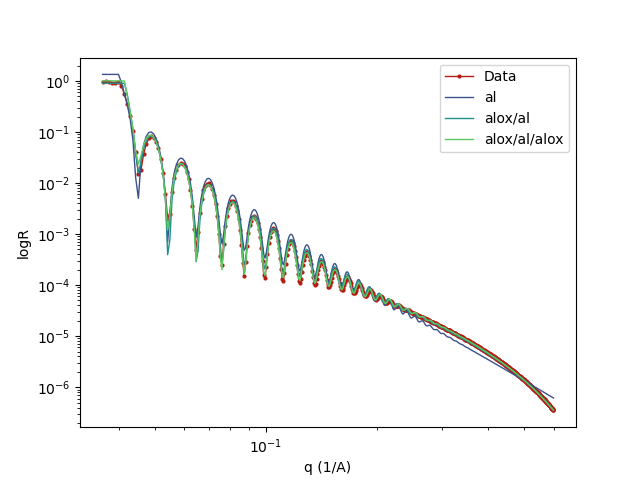

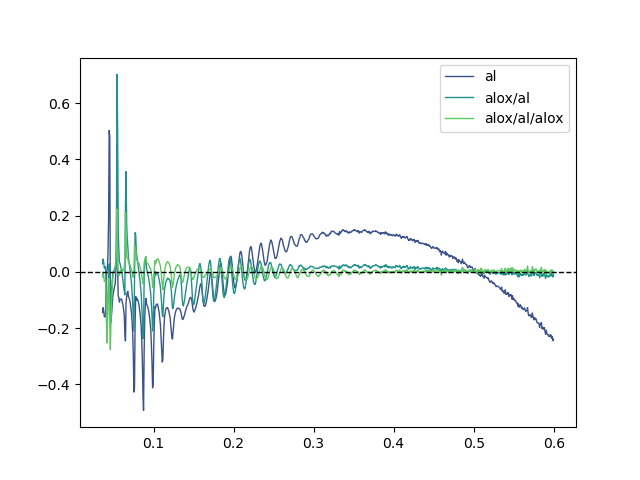

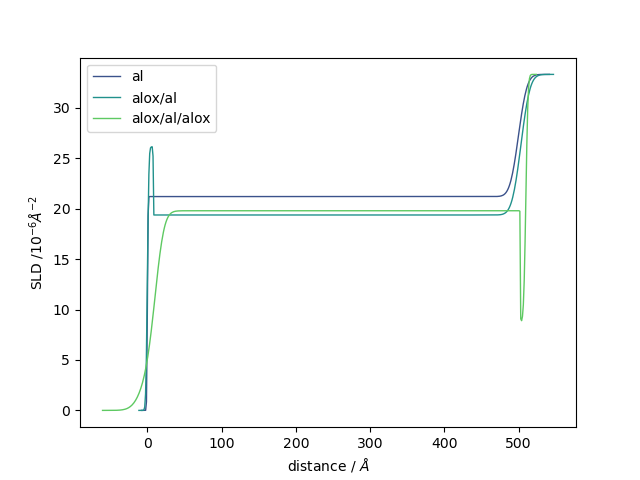

In [9]:
sns.set_palette('viridis',3)
mpl.rcParams['lines.linewidth'] = 1
ana_xrr.plot_obj([obj1, obj2,obj3],['al','alox/al', 'alox/al/alox'])

In [65]:
qrng = [0.037, 0.6]
obj1, par1 = ana_xrr.sim_al(pth+flist[1], level='al/alox/al', qrng=qrng,cfg_in={'al':{'rough':5,'thk':300 }}, plot=False)
obj2 , par2  = ana_xrr.sim_al(pth+flist[1], level='alox/al/alox/al', qrng=qrng,cfg_in={'al':{'rough':5,'thk':300 }}, plot=False)
obj3 , par3  = ana_xrr.sim_al(pth+flist[1], level='alox/al/alox/al/buff', qrng=qrng,cfg_in={'al':{'rough':5,'thk':300 }}, plot=False, careful=True)


8.119651546467418: : 78it [00:07, 11.12it/s] 
0.3673523594083498: : 552it [01:13,  7.53it/s] 


0.8058087486826121: : 257it [00:46,  5.50it/s]


2.89020966969515: : 778it [02:43,  4.77it/s]  

In [83]:
obj4 , par4  = ana_xrr.sim_al(pth+flist[1], level='alox/al/buff/alox/al/buff', qrng=qrng,cfg_in={'al':{'rough':5,'thk':300 }}, plot=False)

# Changing the thicknesses allowed completely changed ability of model to converge 
# allowing Al SLD to fit separately made everything fit much better even though tehy ended up wtihin 0.2 

0.12674345466076603: : 1000it [03:21,  4.96it/s]

In [85]:
ana_xrr.generate_table(par4)

Layer Properties:
      Layer  Thickness (nm)  Roughness (nm)  SLD (10^-6 cm^-2)
   AlOx_top        3.998512        2.137924          55.886010
     Al_top      203.206556        2.796637          21.489530
Buff_JJ_top        9.362464        4.847828          16.952165
    AlOx_JJ        9.223120        4.771530          26.738173
         Al      246.332183        5.316515          21.285301
Buff_JJ_bot       34.721122        9.971072          16.697278
  Substrate             inf       13.127675          33.319000

Additional Parameters:
      Parameter              Value
          Chisq 0.2532430196321745
     Background                0.0
DQ - Resolution                2.0
       Q Offset           -0.00184


In [64]:
print(obj4)

________________________________________________________________________________
Objective - 5897929232
Dataset = <None>, 747 points
datapoints = 747
chi2 = 0.9101248524346015
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
________________________________________________________________________________
<Parameter:    'scale'    , value=1.09754 +/- 0.0151, bounds=[0.9, 1.35]>
<Parameter:     'bkg'     , value=2.37436e-07 +/- 2.44e-06, bounds=[1e-09, 5e-07]>
<Parameter:'dq - resolution', value=2  (fixed) , bounds=[0.001, 3.0]>
<Parameter:  'q_offset'   , value=-0.00193843 +/- 4.54e-05, bounds=[-0.025, 0.025]>
________________________________________________________________________________
________________________________________________________________________________
<Parameter: 'Air - thick' , value=inf  (fixed) , bounds=[-inf, inf]>
_________________________________________________________________________

In [ ]:


obj5, par5  = ana_xrr.sim_al(pth+flist[1], level='alox/al/buff/alox/buff/al/alox', qrng=qrng,cfg_in={'al':{'rough':5,'thk':300 }}, plot=False, careful=False)
pp = ana_xrr.compare_models([par1, par2, par3, par4])

In [21]:
par2

{'thk': array([  7.70083884, 209.89955034,   0.33635   , 288.60668886,
                 inf]),
 'rough': array([ 1.69430037,  0.02823235,  5.15983042,  7.65659801, 10.54382202]),
 'sld': array([33.02603517, 19.95864332, 45.19291657, 19.95864332, 33.319     ]),
 'layers': array(['AlOx_top', 'Al', 'AlOx_JJ', 'Al', 'Substrate'], dtype='<U9'),
 'chisq': array(0.72474643),
 'bkg': 2.5858852009983164e-07,
 'dq - resolution': 2.0,
 'q_offset': -0.0018941980279570197}

In [18]:
par2

{'thk': array([2.12879576e+00, 2.15609451e+02, 2.57092558e-01, 2.89564001e+02,
                   inf]),
 'rough': array([ 1.91438228,  4.96757688,  4.86200916,  8.3472818 , 10.49184855]),
 'sld': array([56.69965251, 19.92572267, 38.16918423, 19.92572267, 33.319     ]),
 'layers': array(['AlOx_top', 'Al', 'AlOx_JJ', 'Al', 'Substrate'], dtype='<U9'),
 'chisq': array(0.81888587),
 'bkg': 1e-09,
 'dq - resolution': 2.0,
 'q_offset': -0.0019064105226330164}

### Currently scratch for comparing parameters across models

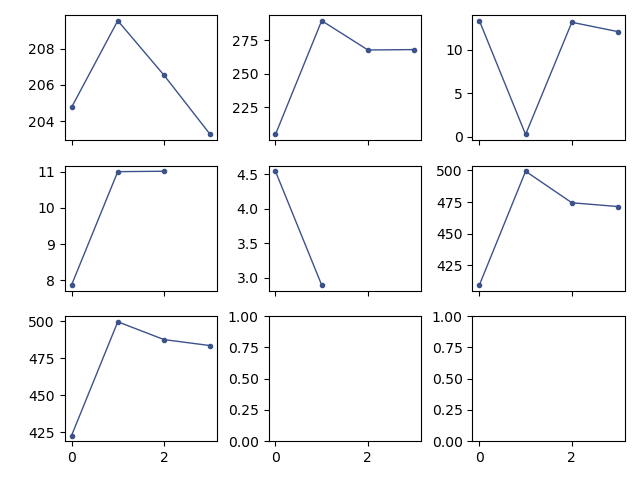

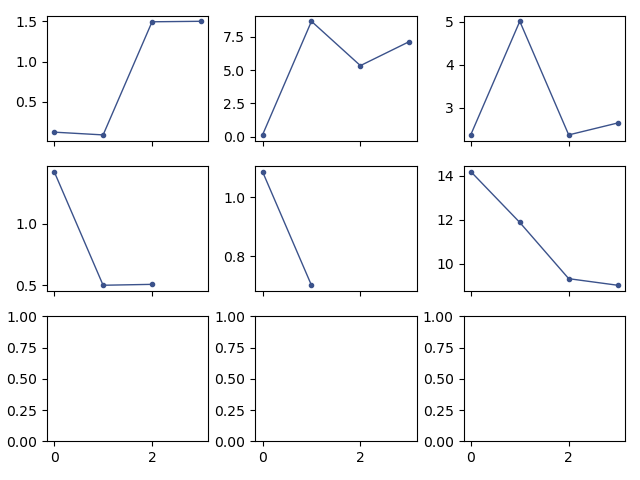

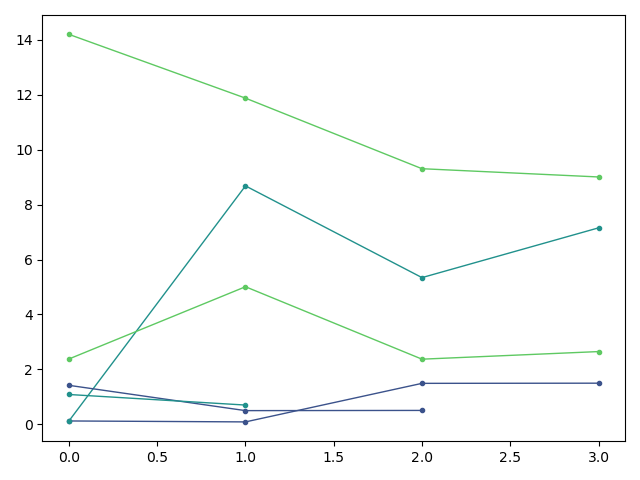

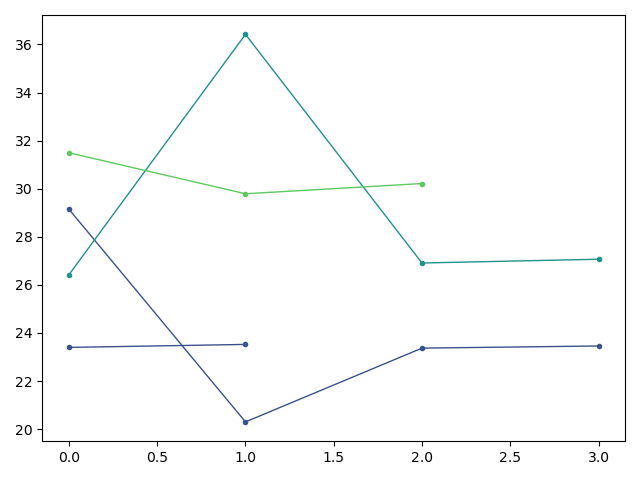

In [41]:
fig, ax = plt.subplots(3,3, sharex=True) 
ax = ax.flatten()

ax[0].plot(pp['thick']['Al'],'.-')
ax[1].plot(pp['thick']['Al1'],'.-')
ax[2].plot(pp['thick']['AlOx_JJ'],'.-')
ax[3].plot(pp['thick']['AlOx_top'],'.-')
ax[4].plot(pp['thick']['AlOx_bot'],'.-')
ax[5].plot(np.array(pp['thick']['Al'])+np.array(pp['thick']['Al1']),'.-')
ax[6].plot(np.array(pp['thick']['Al'])+np.array(pp['thick']['Al1'])+np.array(pp['thick']['AlOx_JJ']),'.-')
fig.tight_layout()

fig, ax = plt.subplots(3,3, sharex=True) 
ax = ax.flatten()

ax[0].plot(pp['rough']['Al'],'.-')
ax[1].plot(pp['rough']['Al1'],'.-')
ax[2].plot(pp['rough']['AlOx_JJ'],'.-')
ax[3].plot(pp['rough']['AlOx_top'],'.-')
ax[4].plot(pp['rough']['AlOx_bot'],'.-')
ax[5].plot(pp['rough']['Substrate'],'.-')

fig.tight_layout()


fig, ax = plt.subplots(sharex=True) 

ax.plot(pp['rough']['Al'],'.-')
ax.plot(pp['rough']['Al1'],'.-')
ax.plot(pp['rough']['AlOx_JJ'],'.-')
ax.plot(pp['rough']['AlOx_top'],'.-')
ax.plot(pp['rough']['AlOx_bot'],'.-')
ax.plot(pp['rough']['Substrate'],'.-')

fig.tight_layout()


fig, ax = plt.subplots(1,1, sharex=True) 

ax.plot(pp['sld']['Al'],'.-')
ax.plot(pp['sld']['AlOx_JJ'],'.-')
ax.plot(pp['sld']['AlOx_top'],'.-')
ax.plot(pp['sld']['AlOx_bot'],'.-')

fig.tight_layout()


{'thk': array([2.00203461e-01, 2.06519736e+02, 1.20830197e+01, 1.50988047e+00,
       1.30697095e+01, 2.69108779e+02, 5.97849992e+00,            inf]), 'rough': array([ 1.4721457 ,  6.66414432,  2.91007383,  3.91965277,  5.70448681,
        4.88526463, 19.83776947, 13.91934345]), 'sld': array([44.80868589, 20.34542671, 17.67024105, 26.93049992, 22.21964502,
       20.34542671,  8.26300681, 33.319     ]), 'layers': array(['AlOx_top', 'Al', 'Buff_JJ_top', 'AlOx_JJ', 'Buff_JJ_bot', 'Al',
       'AlOx_bot', 'Substrate'], dtype='<U11'), 'chisq': array(1.0626835), 'bkg': 1e-09, 'dq - resolution': 2.076859043786982, 'q_offset': -0.0017827896857705112}


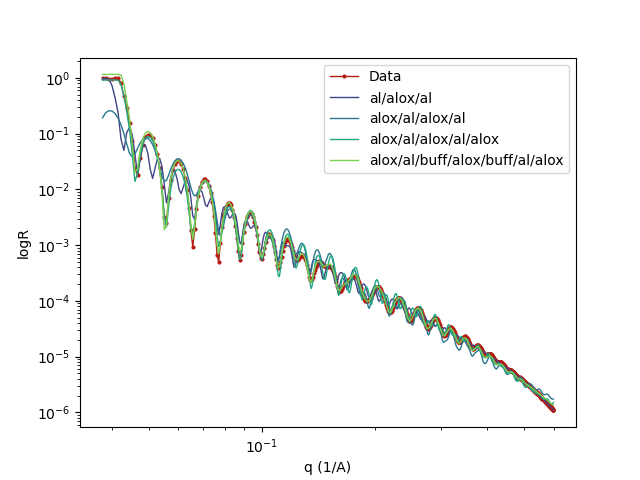

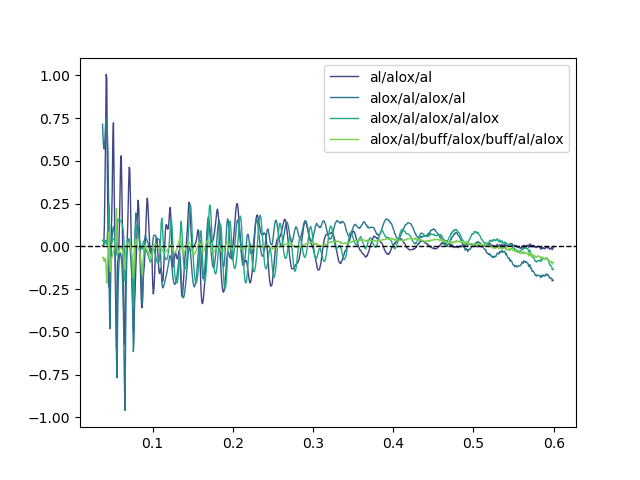

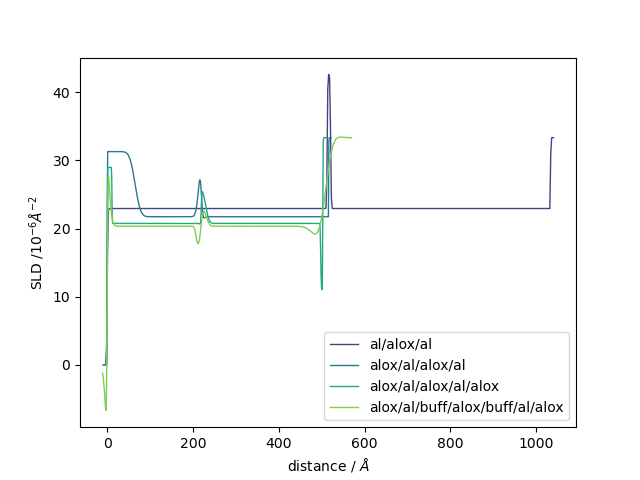

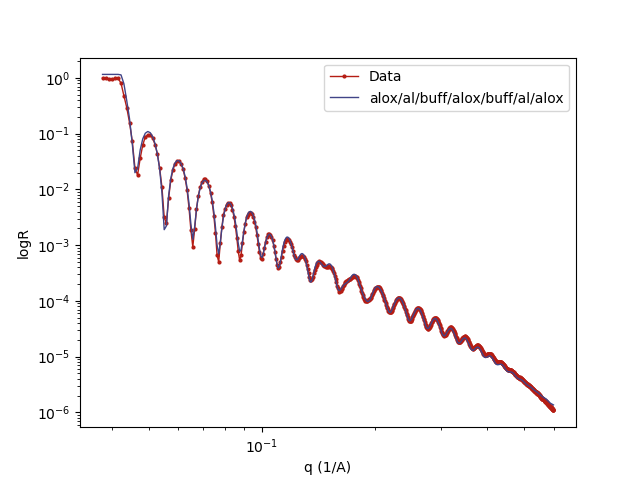

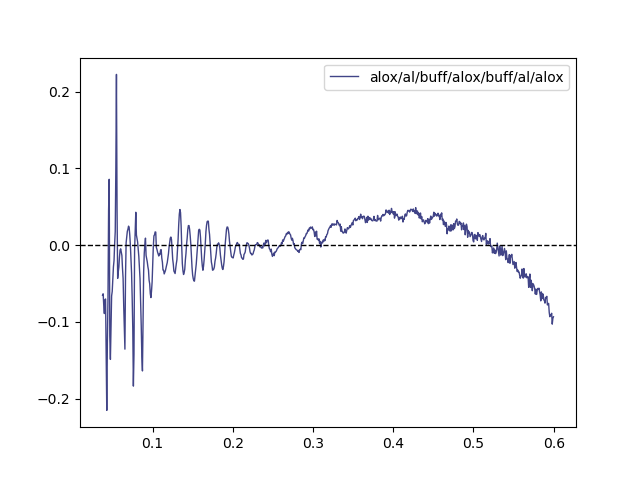

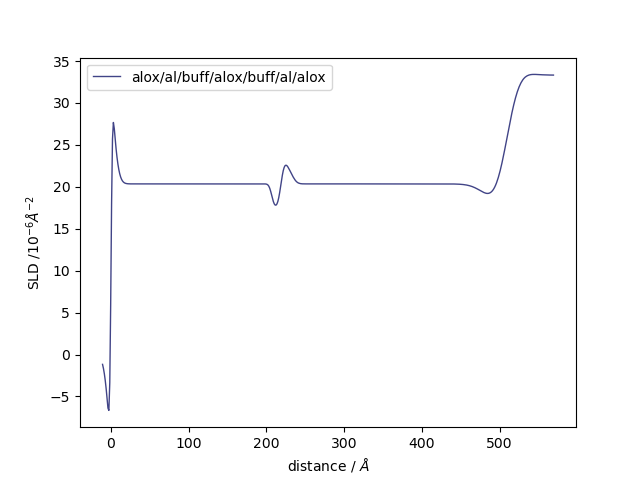

In [27]:
sns.set_palette('viridis',4)
mpl.rcParams['lines.linewidth'] = 1
ana_xrr.plot_obj([obj1, obj2,obj3,obj4],['al/alox/al','alox/al/alox/al', 'alox/al/alox/al/alox','alox/al/buff/alox/buff/al/alox'])
print(par4)

ana_xrr.plot_obj([obj4],['alox/al/buff/alox/buff/al/alox'])


## Fit the al/Nb bilayer

In [48]:
qrng = [0.05, 0.15]
obj1, pars1 = ana_xrr.sim_al(pth+flist[13], level='al/nb', qrng=qrng,cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=False)
obj2, pars2 = ana_xrr.sim_al(pth+flist[13], level='ox/al/nb', qrng=qrng,cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=False)
obj3, pars3 = ana_xrr.sim_al(pth+flist[13], level='ox/al/nb/ox', qrng=qrng,cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=False)
obj4, pars4 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=qrng,cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=False)


0.6646994735010847: : 119it [00:08, 14.32it/s]


0.49367418946223657: : 236it [00:22, 10.48it/s]
0.31597283619299793: : 361it [00:44,  8.09it/s]


0.2754876623784052: : 1000it [02:35,  6.43it/s]

In [40]:
print(pars1)
print(pars2)
print(pars3)
print(pars4)

{'thk': array([ 86.06809047, 564.590679  ,          inf]), 'rough': array([0.09734245, 6.77844022, 0.12931761]), 'sld': array([29.1341553, 67.5018503, 33.319    ]), 'layers': array(['Al', 'Nb', 'Substrate'], dtype='<U9'), 'chisq': array(7.42630421), 'bkg': 5e-07, 'dq - resolution': 2.0, 'q_offset': 0.002560839105988222}
{'thk': array([  7.72815032,  76.66179849, 567.83550274,          inf]), 'rough': array([0.2264857 , 9.94890398, 8.16949017, 0.20612967]), 'sld': array([42.93733506, 18.27491342, 65.64966436, 33.319     ]), 'layers': array(['AlOx_top', 'Al', 'Nb', 'Substrate'], dtype='<U9'), 'chisq': array(5.65477536), 'bkg': 1e-09, 'dq - resolution': 2.0, 'q_offset': 0.001570260798658111}
{'thk': array([ 17.40499209,  67.49832652, 577.56144693,   7.38559049,
                inf]), 'rough': array([4.92282116, 0.83123121, 6.31340154, 3.09914709, 2.02609744]), 'sld': array([32.01085339, 15.99773541, 58.67034513,  8.55888012, 33.319     ]), 'layers': array(['AlOx_top', 'Al', 'Nb', 'AlOx_bo

In [62]:
obj5, pars5 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox/buff', qrng=qrng,cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=False)

1.549247110383333: : 1000it [01:17, 12.98it/s]

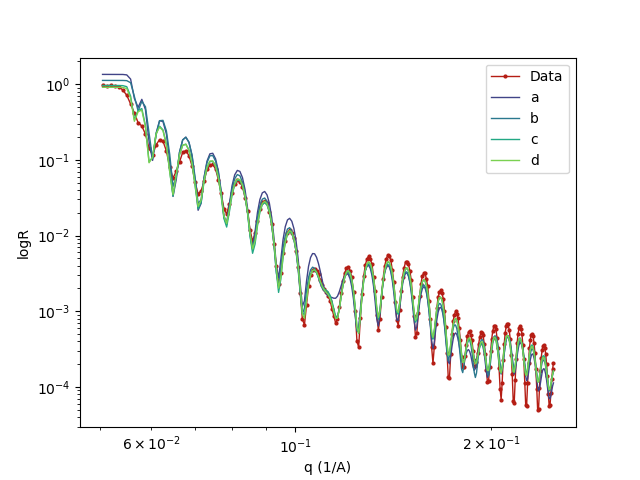

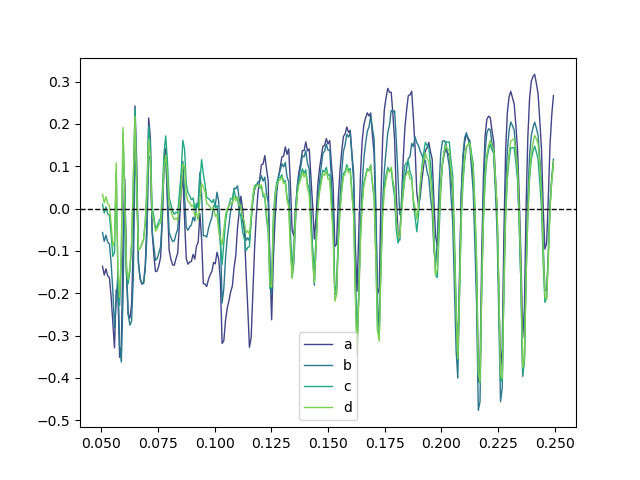

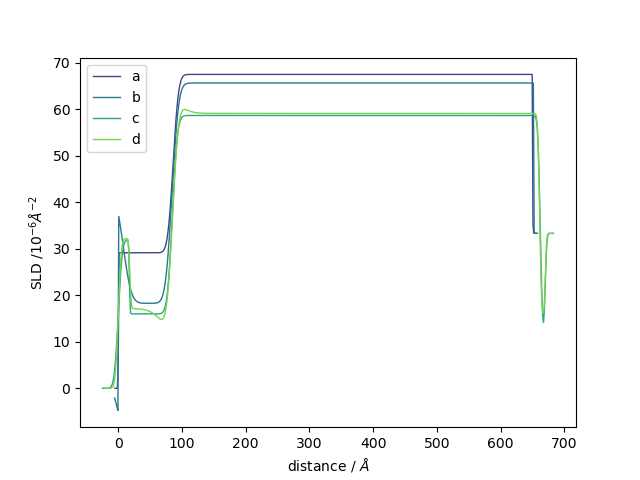

In [41]:
ana_xrr.plot_obj([obj1, obj2,obj3,obj4],['a','b','c','d'])


In [63]:
obj5.model.structure[-3]

Slab(Parameter(value=564.1085081954947, name='Nb - thick', vary=True, bounds=Interval(lb=0.0, ub=2280.0), constraint=None), SLD([Parameter(value=67.42690933127804, name='Nb - sld', vary=True, bounds=Interval(lb=21.345000000000002, ub=128.07), constraint=None), Parameter(value=0.0, name='Nb - isld', vary=False, bounds=Interval(lb=-np.inf, ub=np.inf), constraint=None)], name='Nb'), Parameter(value=7.3942018507070655, name='Nb - rough', vary=True, bounds=Interval(lb=0.0, ub=20.0), constraint=None), name='Nb', vfsolv=Parameter(value=0.0, name='Nb - volfrac solvent', vary=False, bounds=Interval(lb=0.0, ub=1.0), constraint=None), interface=None)

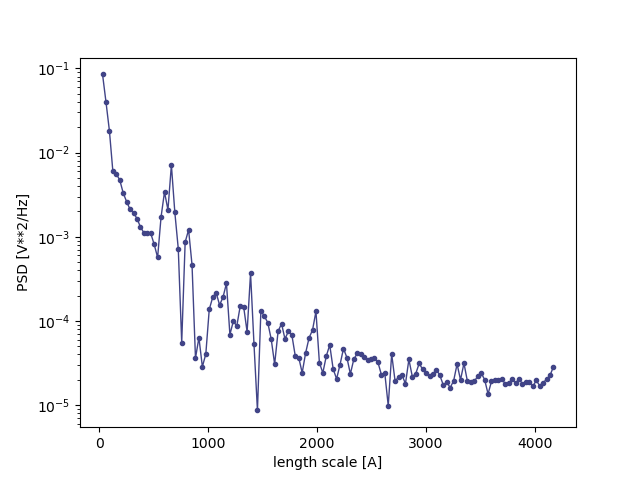

In [43]:
from scipy import signal
plt.figure()
fs = 1/((max(obj1.data.x) - min(obj1.data.x)) / len(obj1.data.x))
f, Pxx_den = signal.periodogram(np.log10(obj1.data.y), fs)
plt.semilogy(f[1:]*2*np.pi, Pxx_den[1:],'.-')
#plt.ylim([1e-9, 1e0])
plt.xlabel('length scale [A]')
plt.ylabel('PSD [V**2/Hz]')
plt.show()

In [49]:
sns.set_palette('viridis',5)
mpl.rcParams['lines.linewidth'] = 1
ana_xrr.plot_obj([obj1, obj2,obj3,obj4,obj5],['al/nb','ox/al/nb', 'ox/al/nb/ox','ox/al/buff/nb/ox','ox/al/buff/nb/ox/buff'])
print(pars5)

NameError: name 'obj5' is not defined

1.3685816449042538: : 667it [00:41, 16.20it/s]


2.7361931599582756


1.380726324996957: : 612it [00:39, 15.63it/s] 


2.755975844624654


1.8890892853029304: : 618it [00:35, 17.17it/s]


3.7560698497740646


1.37207536358419: : 434it [00:26, 16.46it/s]  


2.7369506957103606


1.3893147702360515: : 966it [00:56, 17.00it/s]


2.7757520015928323


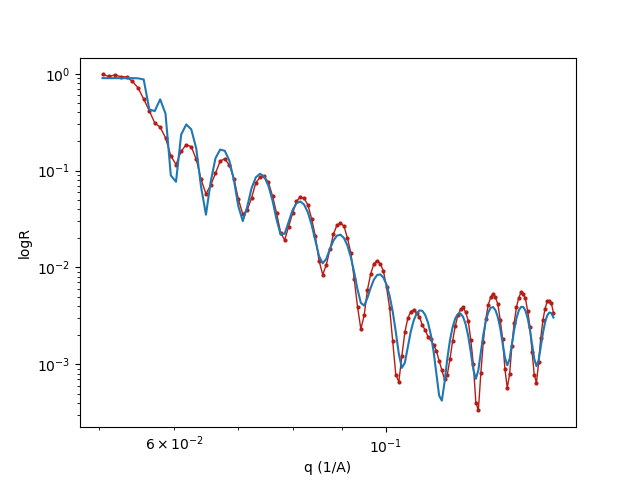

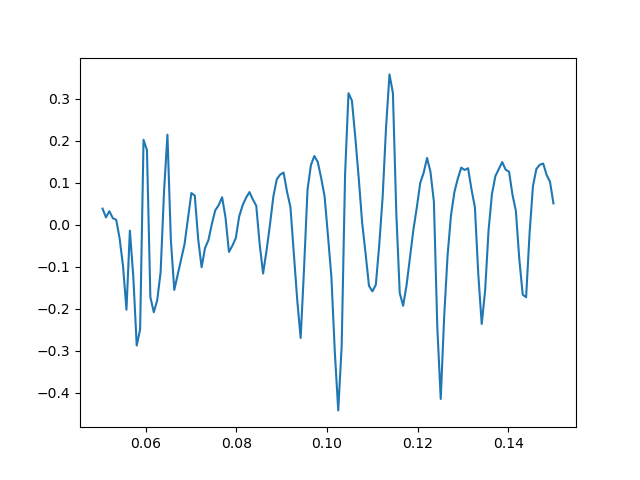

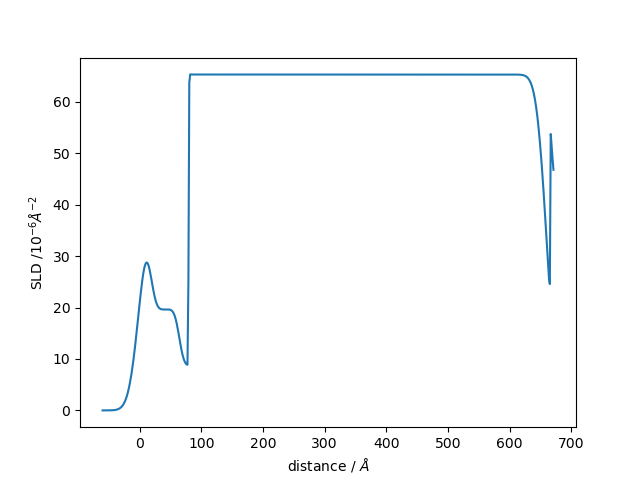

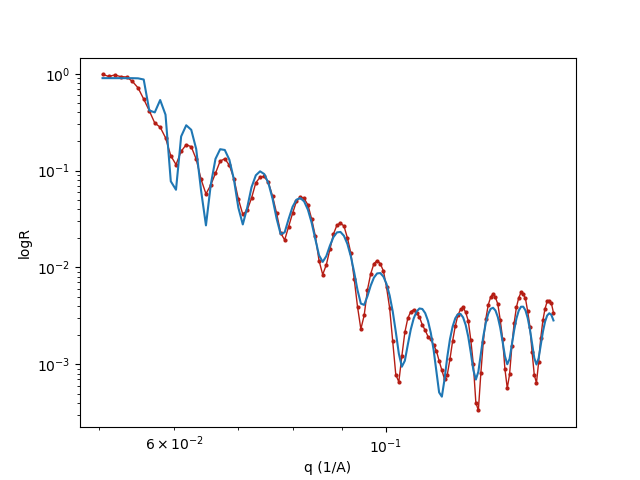

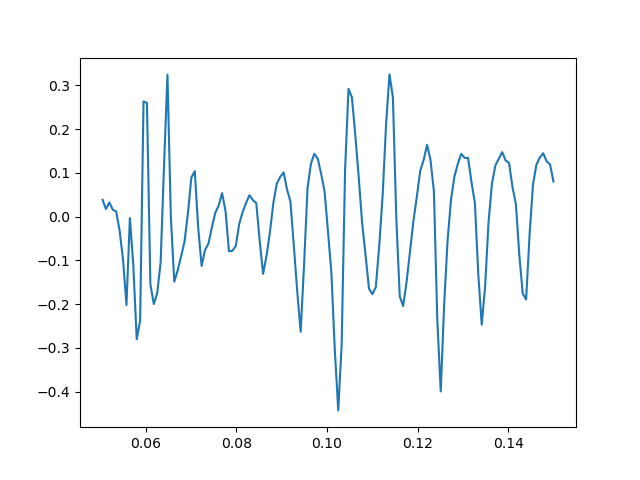

...

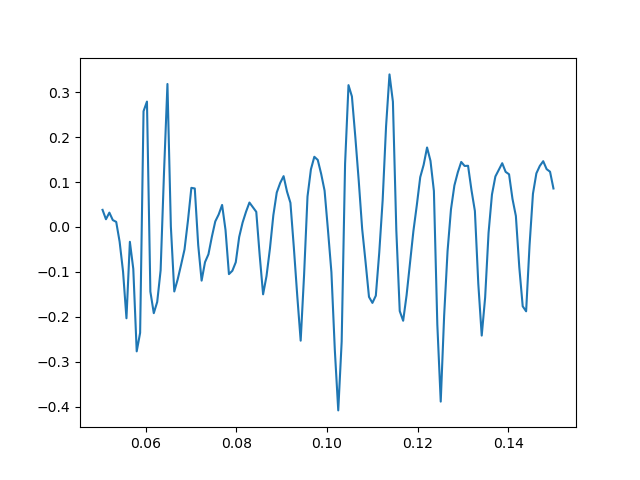

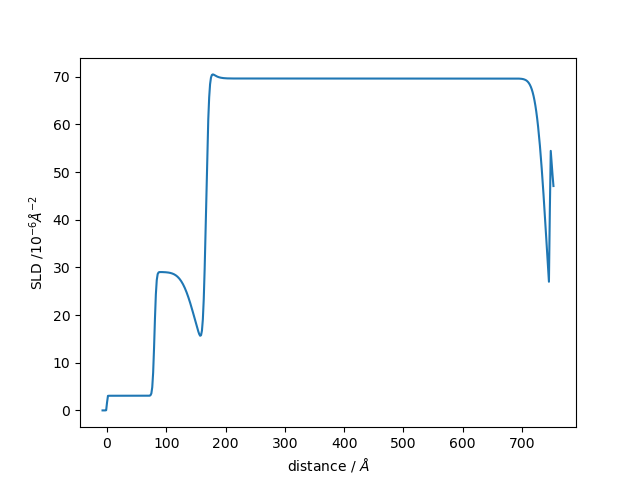

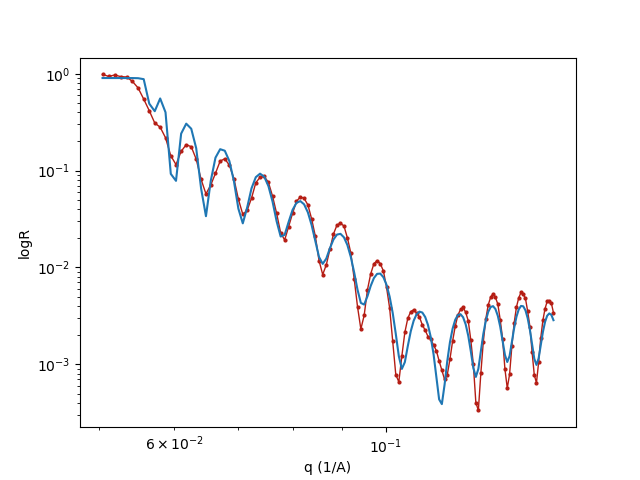

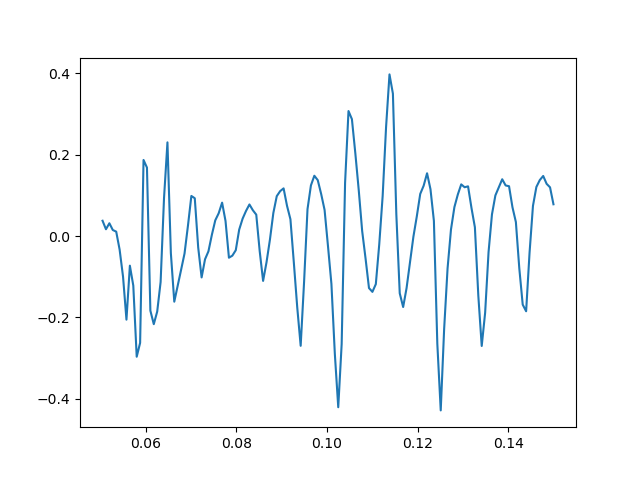

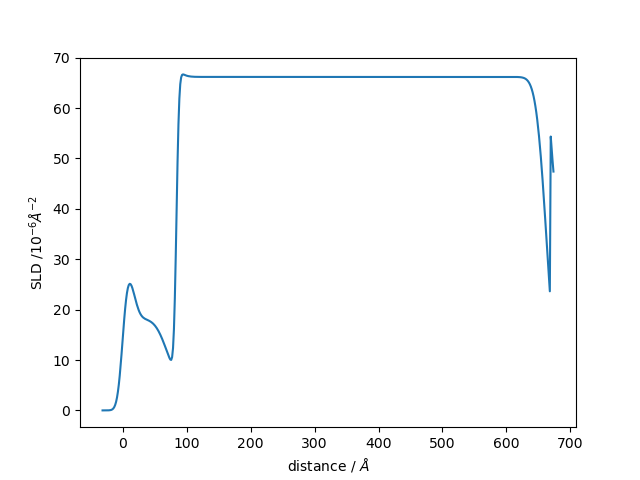

In [10]:
for i in range(5):
    obj0, struct4, pars4 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=[0.05,0.15],cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=True, SLD_rng=1.5)

/Users/sph/Library/CloudStorage/OneDrive-SharedLibraries-LLNL/MQC - JJ - Stanford - General/XRay/XRR/Code/ana_xrr.py:219: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig1 = plt.figure()


________________________________________________________________________________
Objective - 4648051280
Dataset = <None>, 133 points
datapoints = 133
chi2 = 22.49524809785055
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
________________________________________________________________________________
<Parameter:    'scale'    , value=1          , bounds=[0.9, 1.35]>
<Parameter:     'bkg'     , value=3e-08          , bounds=[1e-09, 5e-07]>
<Parameter:'dq - resolution', value=2  (fixed) , bounds=[0.001, 3.0]>
<Parameter:  'q_offset'   , value=0          , bounds=[-0.025, 0.025]>
________________________________________________________________________________
________________________________________________________________________________
<Parameter: 'Air - thick' , value=inf  (fixed) , bounds=[-inf, inf]>
________________________________________________________________________________
<Parameter:  'Air - sl

0.6129396402520385: : 688it [01:47,  6.41it/s]


2.582428141129777: : 933it [55:56,  3.60s/it]  


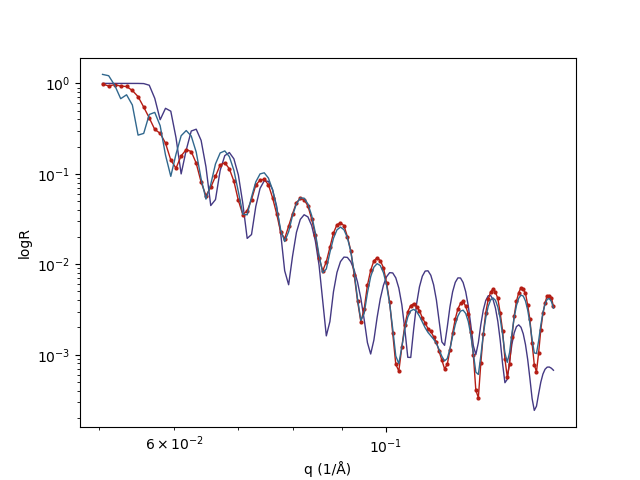

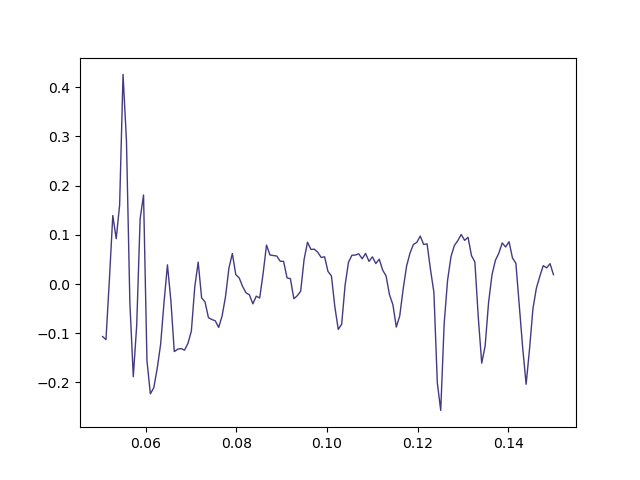

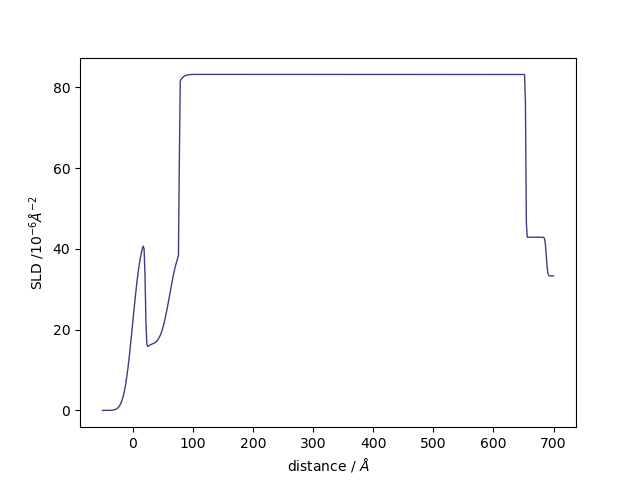

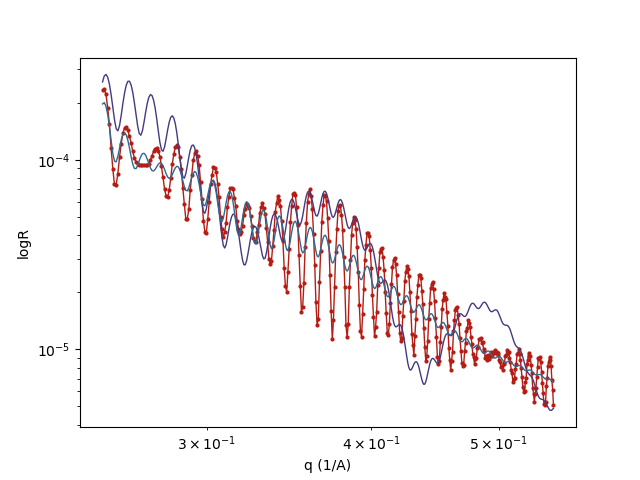

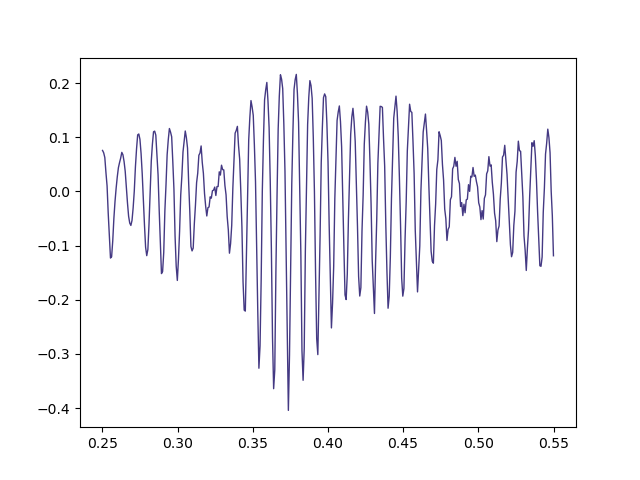

In [50]:
obj0, pars4 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=[0.05,0.15],cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=True, SLD_rng=[1.5,0.3])
obj,pars2 = ana_xrr.refit(obj0, pth+flist[13], qrng=[0.25, 0.55])


2.6664858390473927: : 832it [01:35,  8.71it/s]


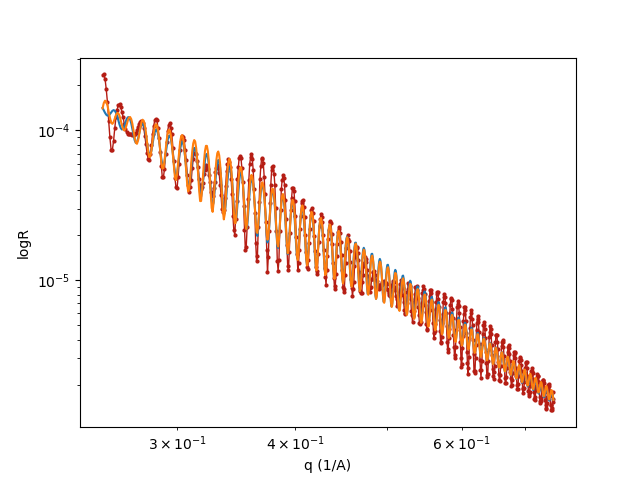

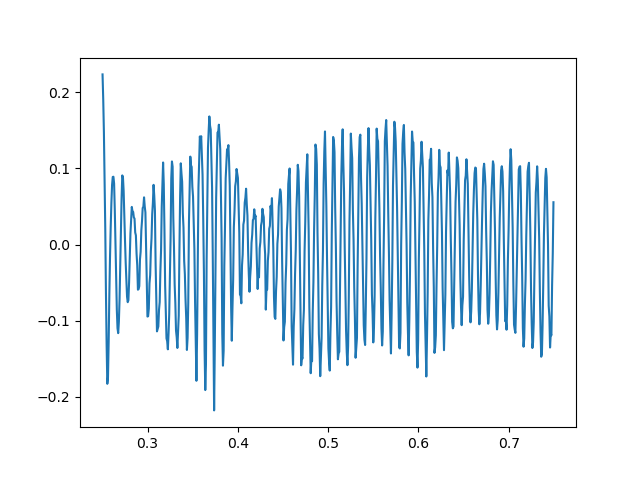

In [26]:
obj,pars2 = ana_xrr.refit(obj, pth+flist[13], qrng=[0.25, 0.75])

In [ ]:

obj,pars2 = ana_xrr.refit(obj, pth+flist[13], qrng=[0.25, 0.75])
print(obj.chisqr())

obj,pars2 = ana_xrr.refit(obj, pth+flist[13], qrng=[0.25, 1])
print(obj.chisqr())

obj,pars2 = ana_xrr.refit(obj, pth+flist[13], qrng=[0.25, 1.2])
print(obj.chisqr())


3.232932448637921: : 510it [00:43, 11.82it/s] 


6.46473182841786


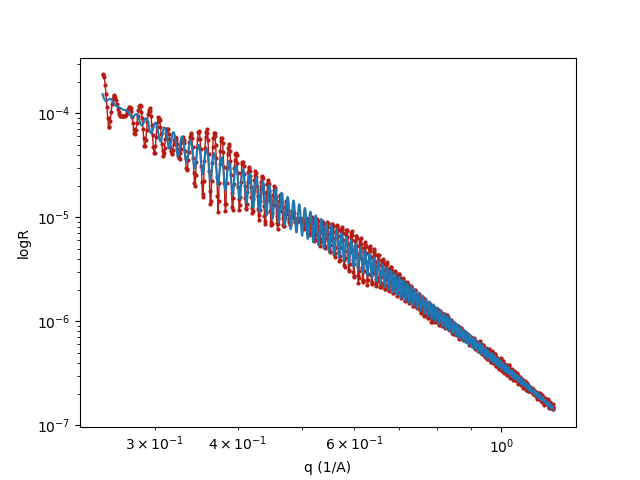

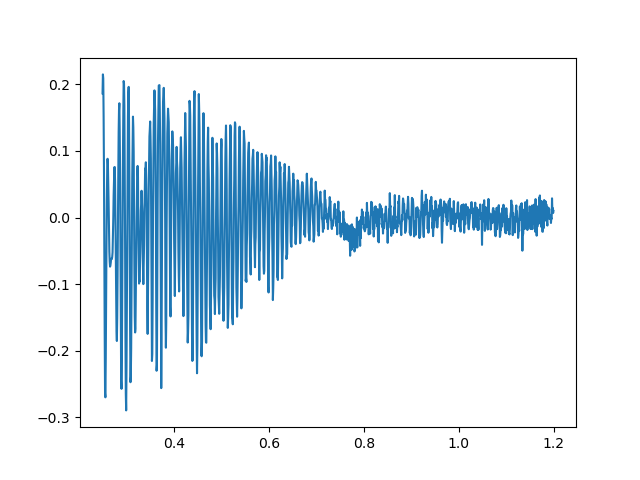

In [4]:
obj,pars2 = ana_xrr.refit(obj, pth+flist[13], qrng=[0.25, 1.2])
print(obj.chisqr())

3.1786791255405955: : 503it [00:42, 11.82it/s]


6.3513857641419795


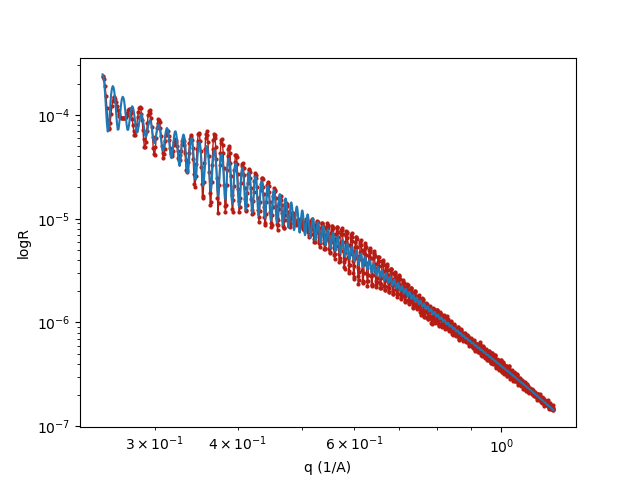

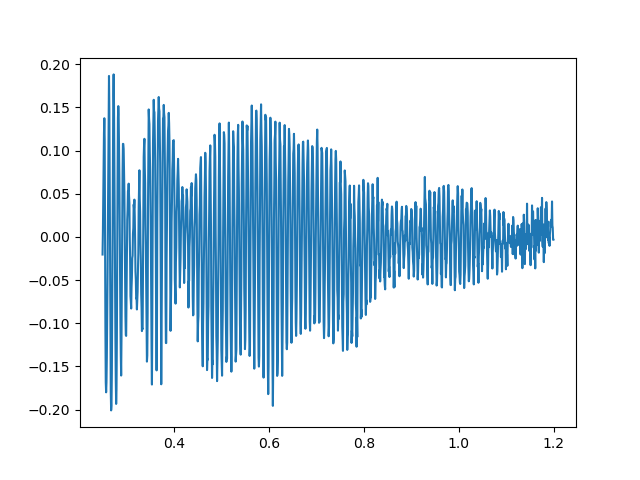

In [7]:
obj2,pars22 = ana_xrr.refit(obj, pth+flist[13], qrng=[0.25, 1.2])
print(obj2.chisqr())

In [50]:
pp = ana_xrr.process_objective(obj)
print(pp)

obj.chisqr()

{'thk': [1.4920916919631786, 104.6886094588325, 3.2927720064081716, 642.9387631831445, 19.996611824481114, inf], 'rough': [8.898676999481376, 5.453401968085616, 2.2951816165996575, 0.8933590055509191, 5.876047806119967, 3.171640754456332], 'sld': [20.94444045213482, 23.217131733248266, 14.673304656639905, 83.57751828822391, 0.8240488778947247, 33.319], 'layers': ['AlOx_top', 'Al', 'Buff_top', 'Nb', 'AlOx_bot', 'Substrate'], 'chisq': 5.822602444789538}


5.822602444789538

In [113]:
import copy

obj2_copy = copy.deepcopy(obj2)

In [37]:
print(pars2)

print(pars22)

cfg = {'al_top':{'rough':1.5, 'thk':45}, 'top_oxide':{'thk':31, 'rough':3}, 'buffer':{'thk':6, 'rough':13}}

{'thk': [31.30699411313327, 45.465387146488276, 5.849592592293251, 583.4266427656308, 0.531666247909319, inf], 'rough': [2.9349361418340734, 1.5357788517388458, 13.021583343715287, 6.774607897477445, 0.9372159806869239, 3.666398733249887], 'sld': [19.169204187766844, 28.925616860440304, 11.937386289076974, 85.81326129855698, 18.373989356433658, 33.319], 'layers': ['AlOx_top', 'Al', 'Buff_top', 'Nb', 'AlOx_bot', 'Substrate'], 'chisq': 1.5572890548729115}
{'thk': [26.58697569353679, 50.7555303781105, 9.198321154942446, 627.4901269924844, 1.188206658060332, inf], 'rough': [4.102356361657381, 5.117430145994377, 2.0280976384129623, 5.047105698342907, 0.9336808904265148, 4.755932379182708], 'sld': [3.993252718122711, 29.794016498569555, 46.75037078273957, 77.21750475418266, 9.216074216898976, 33.319], 'layers': ['AlOx_top', 'Al', 'Buff_top', 'Nb', 'AlOx_bot', 'Substrate'], 'chisq': 5.382909833545739}


________________________________________________________________________________
Objective - 13177671312
Dataset = <None>, 598 points
datapoints = 598
chi2 = 3.8701597683494002
Weighted = False
Transform = Transform('logY')
________________________________________________________________________________
________________________________________________________________________________
<Parameter:    'scale'    , value=2          , bounds=[0.9, 2.0]>
<Parameter:     'bkg'     , value=3e-08          , bounds=[1e-09, 5e-06]>
<Parameter:'dq - resolution', value=0.05  (fixed) , bounds=[0.001, 0.1]>
<Parameter:  'q_offset'   , value=0.018          , bounds=[-0.025, 0.025]>
________________________________________________________________________________
________________________________________________________________________________
<Parameter: 'Air - thick' , value=inf  (fixed) , bounds=[-inf, inf]>
________________________________________________________________________________
<Parameter:  '

0.3120383886158829: : 962it [01:46,  9.06it/s] 


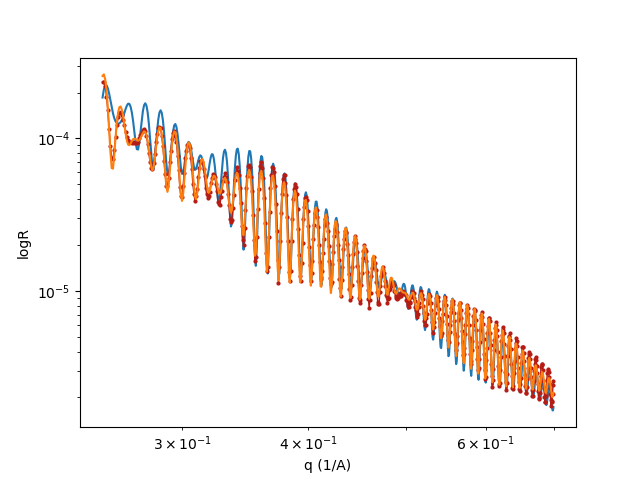

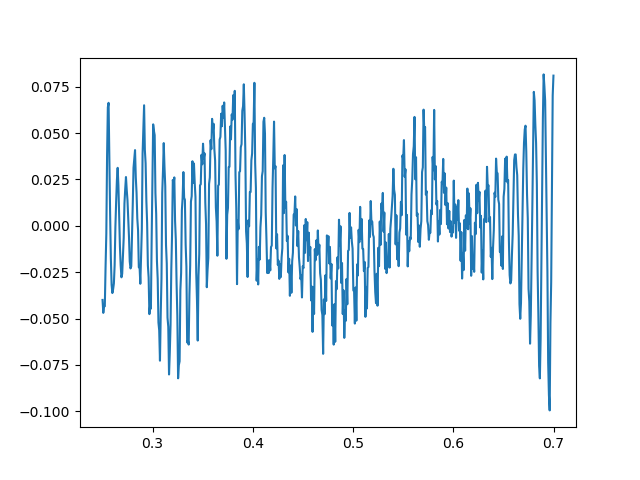

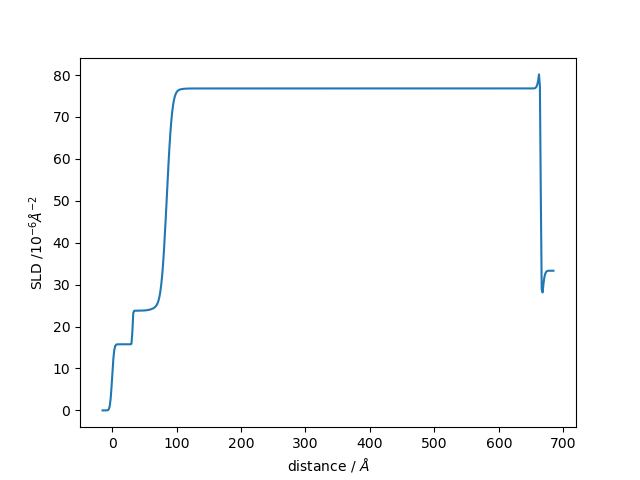

In [71]:
# Alox                Al                Buff                 Nb                 AlOx 
[19.169204187766844, 28.925616860440304, 11.937386289076974, 85.81326129855698, 18.373989356433658, 33.319]
cfg_sld = {'al':29, 'nb':85.8}
cfg_in = {'scale':2, 'bkg':3e-8,'q_offset':0.018}
cfg = {'al':{'rough':1.14, 'thk':45.5}, 'top_oxide':{'thk':31.3, 'rough':2.95}, 'buffer':{'thk':5.8, 'rough':13}, 'nb':{'thk':583, 'rough':6.8}, 'bottom_oxide':{'thk':0.5, 'rough':0.93},'substrate':{'rough':3.67,'rough_max':15}}
obj1, struct5, pars5 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=[0.25,0.7],cfg_in=cfg, cfg_sld_in=cfg_sld,plot=True, SLD_rng=1.5, cfg_in2=cfg_in, no_fit=False, careful=True)


### Al/Nb

1.2031776324908132: : 350it [00:50,  6.98it/s]


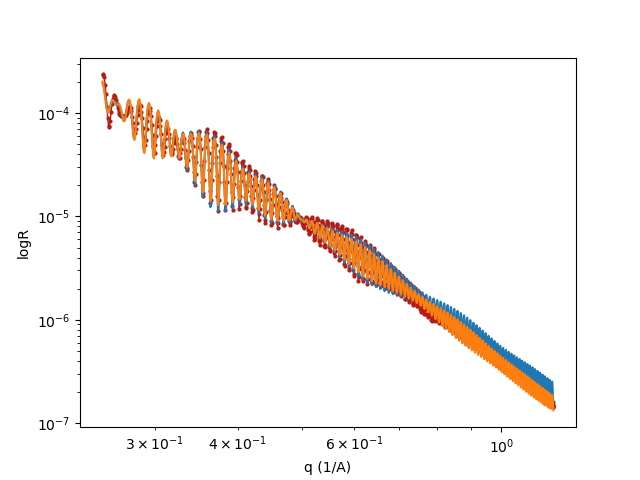

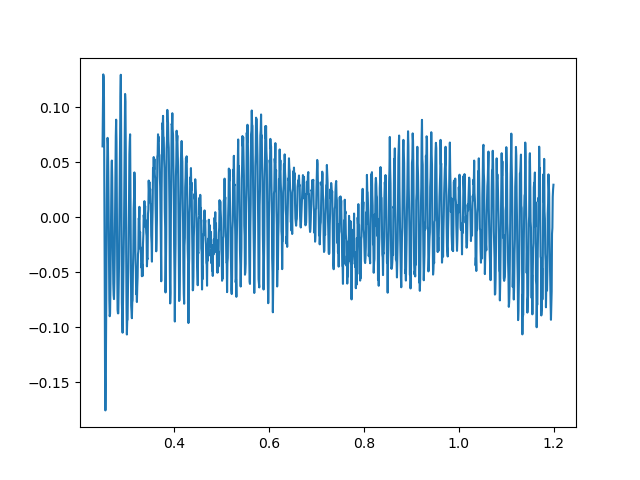

In [114]:
obj7,pars7 = ana_xrr.refit(copy.deepcopy(obj), pth+flist[13], qrng=[0.25, 1.2], reset=False, fit=True)

0.560318558741118: : 693it [01:26,  8.02it/s] 


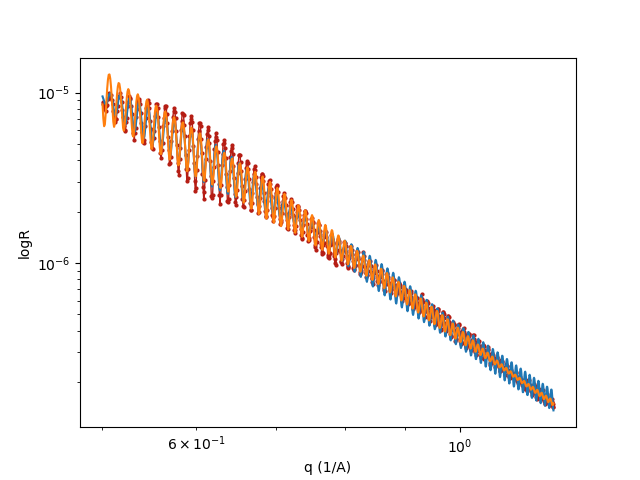

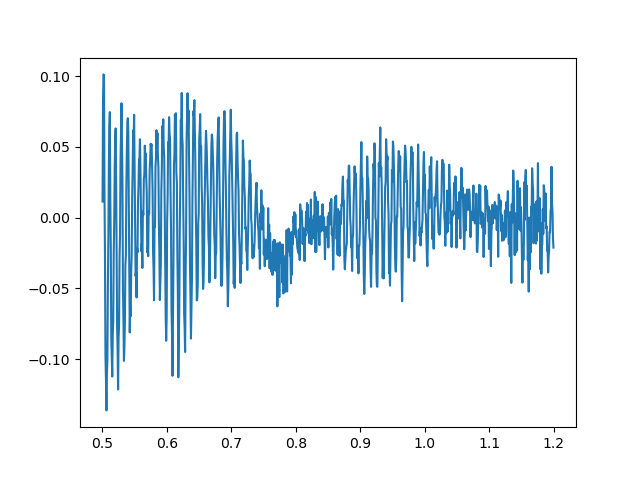

In [119]:
#obj7,pars7 = ana_xrr.refit(copy.deepcopy(obj), pth+flist[13], qrng=[0.5, 1.2], reset=False, fit=True)
#obj8,pars8 = ana_xrr.refit(copy.deepcopy(obj7), pth+flist[13], qrng=[0.5, 1.2], reset=True, fit=True)
obj8,pars8 = ana_xrr.refit(copy.deepcopy(obj7), pth+flist[13], qrng=[0.5, 1.2], reset=True, fit=True)

0.4625874330464086: : 438it [00:50,  8.63it/s] 


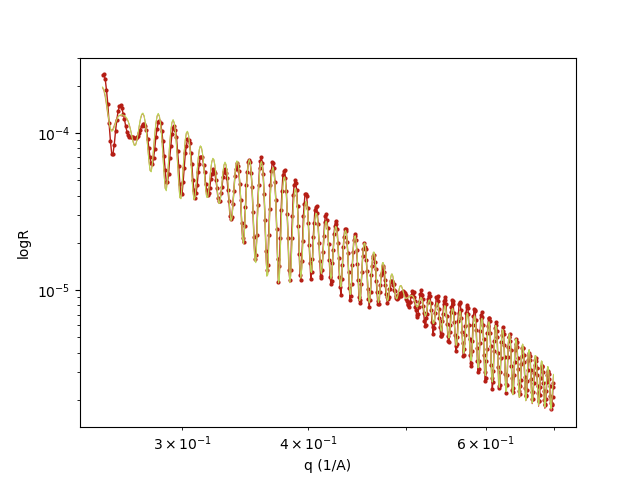

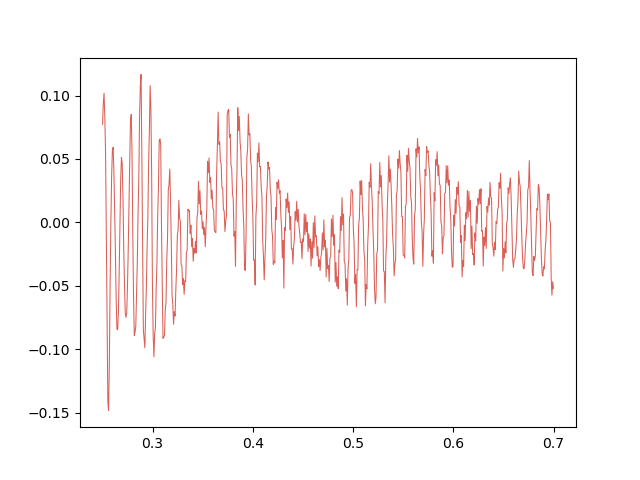

In [134]:
obj,pars2 = ana_xrr.refit(obj0, pth+flist[13], qrng=[0.25, 0.7])

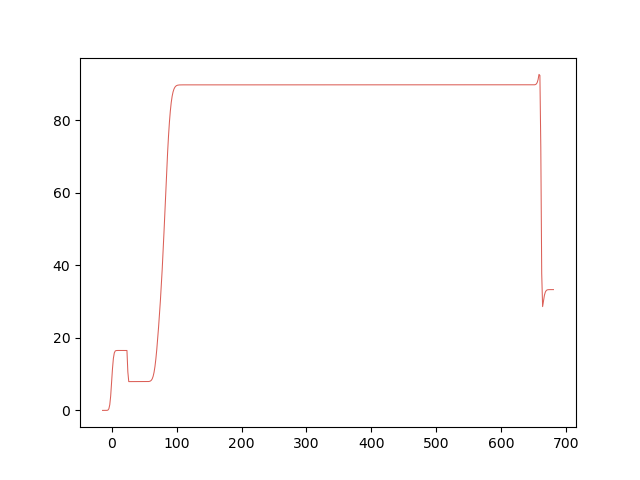

In [137]:
plt.figure()
plt.plot(*obj.model.structure.sld_profile())

1.6923497790294748: : 502it [00:33, 14.93it/s]


3.3757709841442702


3.9146979999050164: : 418it [00:28, 14.93it/s]


7.813536086485088


6.329704734906038: : 297it [00:18, 15.74it/s]


12.626537952877921


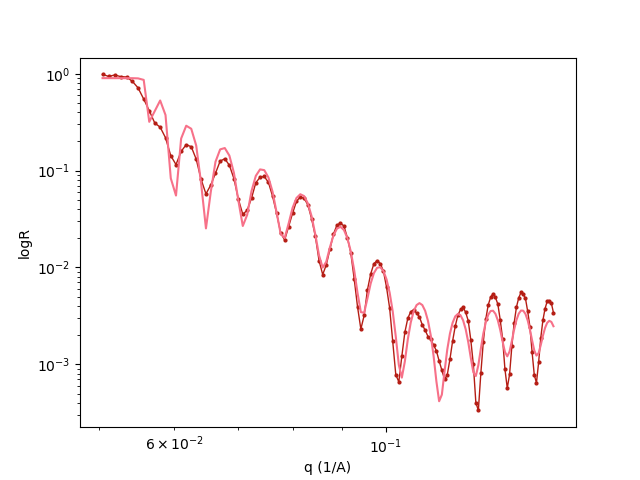

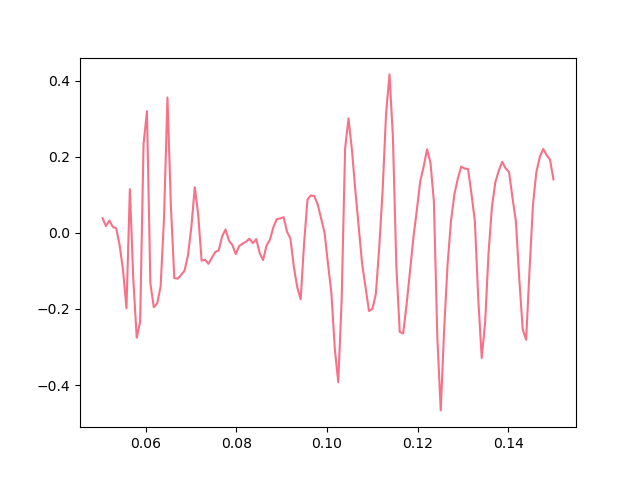

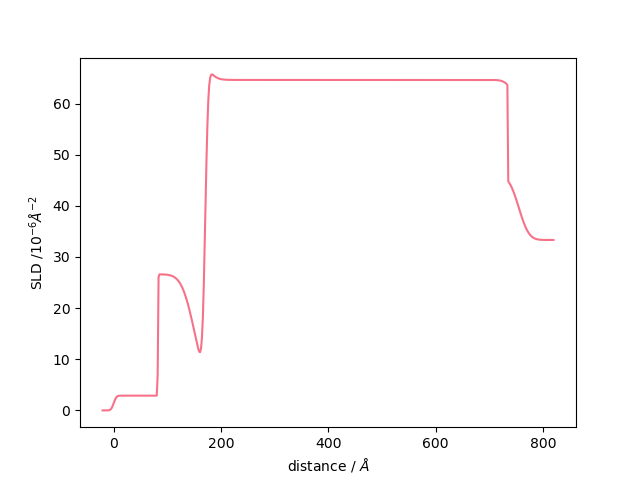

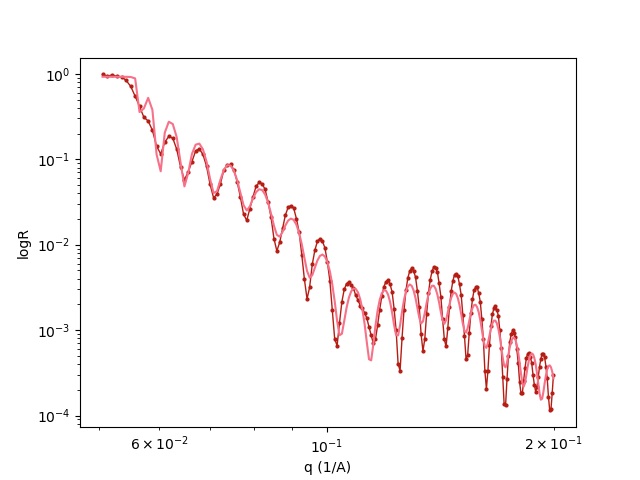

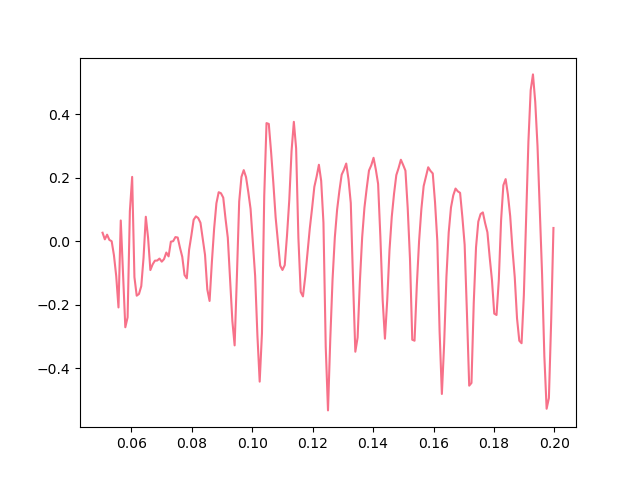

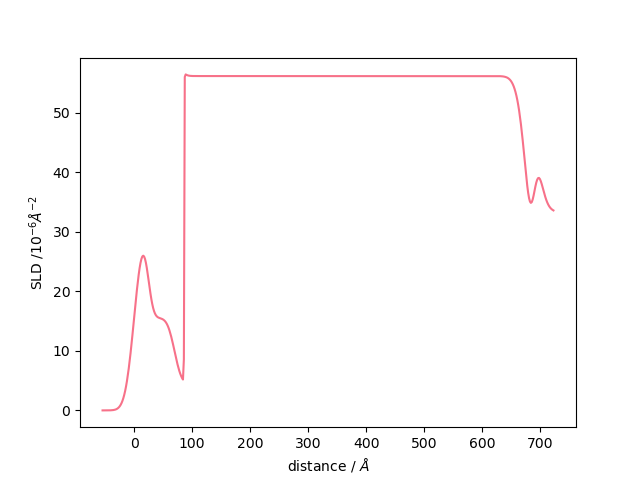

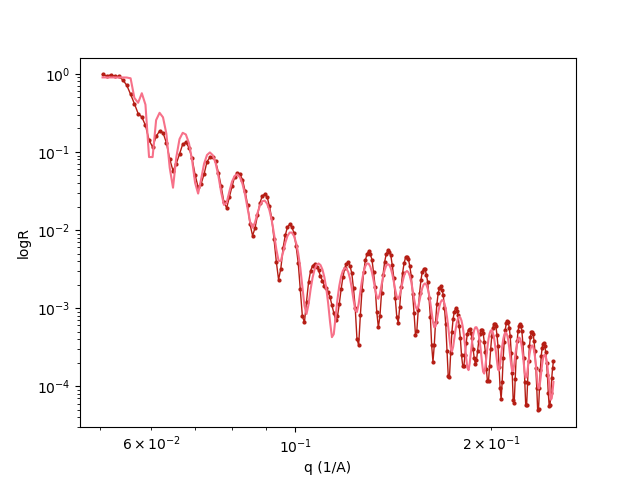

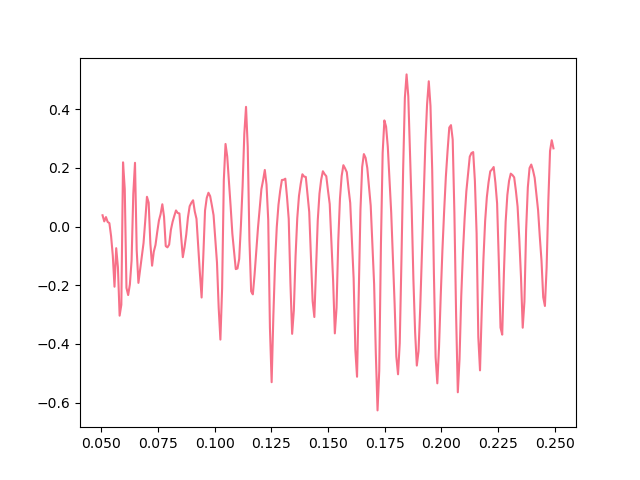

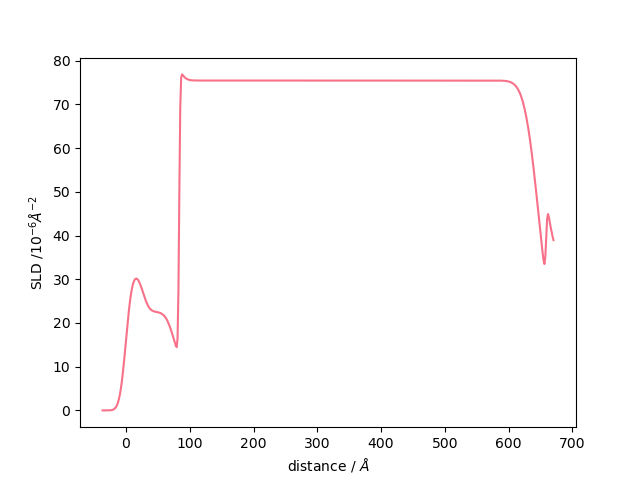

In [28]:
obj, struct4, pars4 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=[0.05,0.15],cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=True, SLD_rng=1.5)
print(obj.chisqr())
obj, struct4, pars4 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=[0.05,0.2],cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=True, SLD_rng=1.5)
print(obj.chisqr())
obj, struct4, pars4 = ana_xrr.sim_al(pth+flist[13], level='ox/al/buff/nb/ox', qrng=[0.05,0.25],cfg_in={'al':{'rough':1,'thk':80}, 'nb':{'rough':6,'thk':570}}, plot=True, SLD_rng=1.5)
print(obj.chisqr())

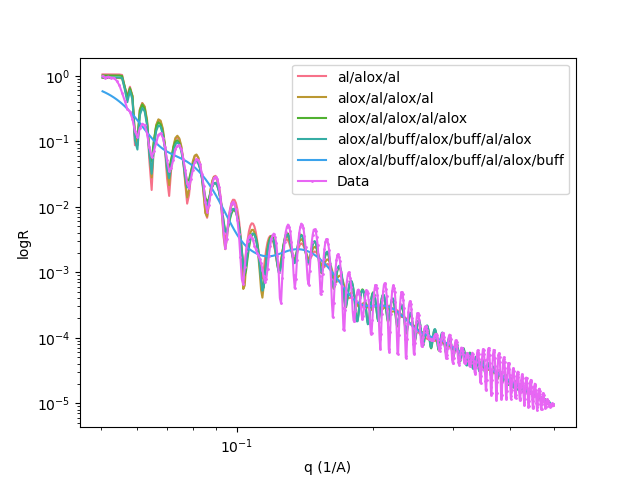

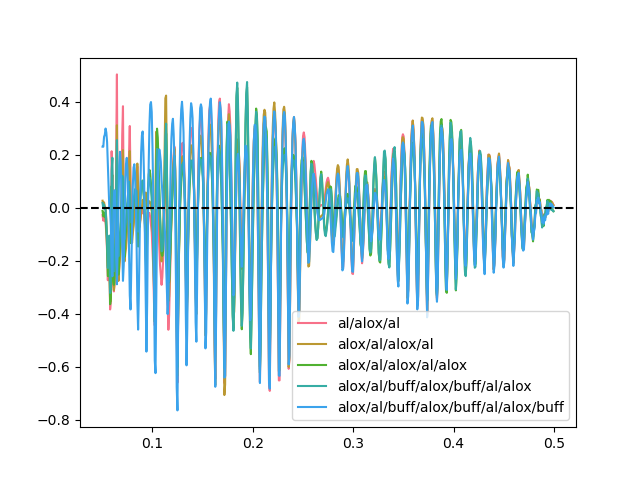

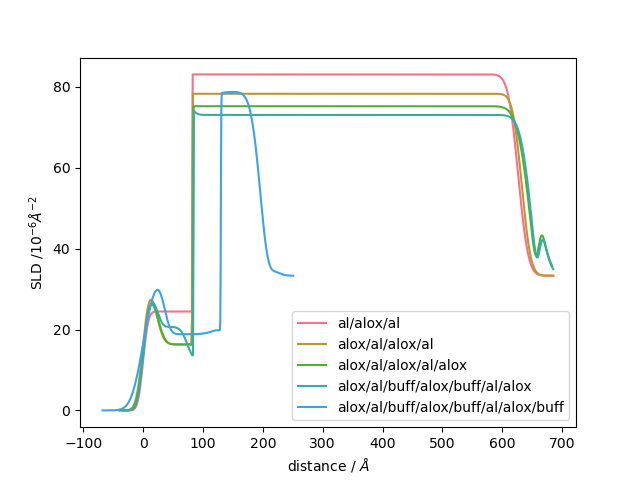

In [15]:
sns.set_palette('husl',6)
ana_xrr.plot_obj([obj1, obj2,obj3,obj4,obj5],['al/alox/al','alox/al/alox/al', 'alox/al/alox/al/alox','alox/al/buff/alox/buff/al/alox','alox/al/buff/alox/buff/al/alox/buff'], [struct1,struct2,struct3,struct4,struct5])

In [103]:
thk =[]
rough =[]
sld = []
lays = []
#obj2.parameters[1][1][2].value
for i in range(1,len(obj2.parameters[1])):
    lays.append(obj2.parameters[1][i].name)
    rough.append(obj2.parameters[1][i][2].value)
    thk.append(obj2.parameters[1][i][0].value)
    sld.append(obj2.parameters[1][i][1][0].value)

print(lays)
print(rough)
print(sld)
print(thk)

['AlOx_top', 'Al', 'Buff_top', 'AlOx_JJ', 'Buff_top', 'Al', 'AlOx_bot', 'Substrate']
[19.945185558412913, 9.985603833477906, 19.728034941020432, 0.04598735669629092, 2.0612326347148766, 0.3774583636147566, 10.843833523256064, 9.654149856070868]
[13.806133988225648, 21.29396881053823, 30.802240225510197, 5.4763540419719305, 30.802240225510197, 21.29396881053823, 5.08310749200615, 8.419]
[66.61109780773988, 465.48986406932914, 19.953225568877606, 9.223276021154739, 1.220753130859696, 469.42287431168523, 19.675303991529294, inf]
